#Librerias necesarias

In [1]:
# Se importan las librerias necesarias
import io
from google.colab import files
import matplotlib.pyplot as plt
import numpy as np
import itertools
import seaborn as sns
import pandas as pd
from datetime import date
from datetime import datetime


#Carga de datos

In [2]:
# Metodo para cargar los datasets facilmente
def upload_files ():
  uploaded = files.upload()
  for fn in uploaded.keys():
    print('User uploaded file "{name}" with length {length} bytes'.format(
        name=fn, length=len(uploaded[fn])))
    df = pd.read_csv(io.StringIO(uploaded[fn].decode('utf-8')))
    return df

In [3]:
from IPython.display import HTML
import base64  

def create_download_link( df, title = "Descarga del dataset", filename ="df.csv"):  
    csv = df.to_csv()
    b64 = base64.b64encode(csv.encode())
    payload = b64.decode()
    html = '<a download="{filename}" href="data:text/csv;base64,{payload}" target="_blank">{title}</a>'
    html = html.format(payload=payload,title=title,filename=filename)
    return HTML(html)

#Se integran los datos

In [ ]:
df_base = upload_files()
df_base.head()

Saving ^IBEX (4).csv to ^IBEX (4).csv
User uploaded file "^IBEX (4).csv" with length 469368 bytes


,Date,Open,High,Low,Close,Adj Close,Volume
0,2000-01-03,11641.400391,11881.799805,11574.400391,11610.000000,11609.988281,0.0
1,2000-01-04,11530.000000,11530.000000,11159.799805,11206.599609,11206.587891,0.0
2,2000-01-05,11068.099609,11068.099609,10824.900391,10863.099609,10863.088867,0.0
3,2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN
4,2000-01-07,10882.700195,11137.900391,10882.700195,11102.400391,11102.388672,0.0


In [ ]:
#Se convierte la fecha de string a datetime
df_base['Date'] = pd.to_datetime(df_base['Date'], errors='coerce')

In [ ]:
#Se carga dataset de empresa/indice
df = upload_files()
df.head()

Saving AENA.MC.csv to AENA.MC.csv
User uploaded file "AENA.MC.csv" with length 137700 bytes


,Date,Open,High,Low,Close,Adj Close,Volume
0,2015-03-02,83.000000,83.500000,82.239998,82.500000,64.811409,2583851.0
1,2015-03-03,82.650002,82.900002,81.510002,82.000000,64.418602,1441237.0
2,2015-03-04,82.570000,83.599998,81.620003,83.480003,65.581284,751320.0
3,2015-03-05,83.889999,85.980003,82.879997,84.610001,66.469009,2961863.0
4,2015-03-06,84.800003,85.099998,83.500000,84.900002,66.696831,1024916.0


In [ ]:
#Prepara los datasets para el merge
def preprocesoCloseDate(df, name):
  df = df.drop(['High','Low','Open','Adj Close','Volume'],1)
  df['Date'] =  pd.to_datetime(df['Date'], errors='coerce')
  df[name] = df['Close']
  df = df.drop('Close', 1)
  return df

In [ ]:
df = preprocesoCloseDate(df, 'AENA')
df.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


,Date,AENA
0,2015-03-02,82.500000
1,2015-03-03,82.000000
2,2015-03-04,83.480003
3,2015-03-05,84.610001
4,2015-03-06,84.900002


In [ ]:
#Se integran los datasets en base a la fecha
df_mergeado = pd.merge(df_base, df, on='Date', how='outer')
df_mergeado.head()

,Date,Open,High,Low,Close,Adj Close,Volume,AENA
0,2000-01-03,11641.400391,11881.799805,11574.400391,11610.000000,11609.988281,0.0,NaN
1,2000-01-04,11530.000000,11530.000000,11159.799805,11206.599609,11206.587891,0.0,NaN
2,2000-01-05,11068.099609,11068.099609,10824.900391,10863.099609,10863.088867,0.0,NaN
3,2000-01-06,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2000-01-07,10882.700195,11137.900391,10882.700195,11102.400391,11102.388672,0.0,NaN


In [ ]:
#Se descarga el dataset mergeado
create_download_link(df_mergeado)

#Creacion de indicadores para el dataset base

In [ ]:
pip install finta


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install stockstats

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from stockstats import StockDataFrame
df_indicadores = StockDataFrame.retype(df_base)

In [ ]:
#Se calculan indicadores tecnicos
df_indicadores['rsi']
df_indicadores['wr']
df_indicadores['dma']
df_indicadores['close_10_ema'] 
from finta import TA
df_indicadores['%k'] = TA.STOCH(df_indicadores)
df_indicadores['roc'] = TA.ROC(df_indicadores)
df_indicadores['obv'] = TA.OBV(df_indicadores)
df_macd = TA.MACD(df_indicadores)
df_macd.tail()
df_indicadores['macd'] = df_macd['MACD']
df_indicadores['mom'] = TA.MOM(df_indicadores)
df_indicadores['cmo'] = TA.CMO(df_indicadores)
df_indicadores['tp'] = TA.TP(df_indicadores)
df_indicadores.tail()


,open,high,low,close,adj close,volume,rs_14,rsi,wr,close_10_sma,close_50_sma,dma,close_10_ema,%k,roc,obv,macd,mom,cmo,tp
date,,,,,,,,,,,,,,,,,,,,
2022-07-25,8021.899902,8103.399902,8015.700195,8085.600098,8085.600098,124363100.0,0.939248,48.433630,-21.473978,7997.689990,8326.529951,-328.839961,8036.616991,78.526022,-0.454292,1.530291e+10,-71.204040,20.399903,2.110029,8068.233398
2022-07-26,8063.100098,8097.000000,8033.500000,8069.600098,8069.600098,129251000.0,0.911380,47.681784,-25.391707,8003.170020,8318.407949,-315.237930,8042.613919,74.608293,-0.378995,1.517366e+10,-63.605090,54.800293,-0.266829,8066.700033
2022-07-27,8106.500000,8149.700195,8054.200195,8124.399902,8124.399902,147895400.0,1.020819,50.515121,-11.973534,8021.120020,8311.367939,-290.247920,8057.484098,88.026466,0.734014,1.532155e+10,-52.555158,179.500000,7.892360,8109.433431
2022-07-28,8193.700195,8196.400391,7995.399902,8084.899902,8084.899902,250669600.0,0.940889,48.477208,-25.840177,8049.180029,8304.945937,-255.765908,8062.468790,74.159823,0.874633,1.507088e+10,-46.449882,280.600097,1.290961,8092.233398
2022-07-29,8140.299805,8207.799805,8134.100098,8156.200195,8156.200195,249071400.0,1.093099,52.223947,-11.650400,8070.210059,8298.379941,-228.169883,8079.510863,88.349600,2.659571,1.531996e+10,-35.449429,210.300293,12.080043,8166.033366


In [ ]:
#Se descarga el dataset con los indicadores
create_download_link(df_indicadores)

#Limpieza de los datos

In [ ]:
#Revisamos los nulls
def revisar_nulls (df):
  for col in df.columns:
      pct_missing = np.mean(df[col].isnull())
      if pct_missing > 0:
          print('{} - {}%'.format(col, round(pct_missing*100)))

In [ ]:
#Se crea indicador para valores missing
def encontrar_missing_values (df):
  for col in df.columns:
      missing = df[col].isnull()
      num_missing = np.sum(missing)
    
      if num_missing > 0:  
          print('created missing indicator for: {}'.format(col))
          df['{}_ismissing'.format(col)] = missing
  return df

In [ ]:
#Se muestran los valores missing
def add_columna_missing (df):
  df = encontrar_missing_values(df)
  ismissing_cols = [col for col in df.columns if 'ismissing' in col]
  df['num_missing'] = df[ismissing_cols].sum(axis=1)
  return df

In [ ]:
#Se elimina las columnas con un valor de missing mayor a 
def borrar_filas_missin (df):
  ind_missing = df[df['num_missing'] >= 30].index
  df = df.drop(ind_missing, axis=0)
  return df

In [ ]:
#Se eliminan las columnas auxiliares
def borrar_columnas_auxiliares (df):
 cols_to_drop = ['Open_ismissing', 'High_ismissing', 'Low_ismissing',	'Close_ismissing', 'Adj Close_ismissing',	'Volume_ismissing',	'num_missing']
 #cols_to_drop = ['open_ismissing', 'high_ismissing', 'low_ismissing',	'close_ismissing', 'adj Close_ismissing',	'volume_ismissing',	'num_missing']
 df = df.drop(cols_to_drop, axis=1)
 return df

In [ ]:
df_sin_limpiar = upload_files()
df_sin_limpiar.head()

Saving FINALFECHASACOTADOASUPLOAD.csv to FINALFECHASACOTADOASUPLOAD (1).csv
User uploaded file "FINALFECHASACOTADOASUPLOAD.csv" with length 2869119 bytes


,indice,date,open,high,low,close,adj close,volume,rsi,wr,...,PHM,RED,REP,ROVI,SAB,SAN,SCYR,SGRE,SRL,TEF
0,0,2000-01-03,12585.8,12702.4,12500.9,12538.7,12538.69,0.0,NaN,-81.240695,...,NaN,NaN,NaN,NaN,NaN,11.625,NaN,NaN,NaN,NaN
1,1,2000-02-03,12538.7,12711.6,12450.2,12709.6,12709.59,0.0,100.000000,-0.765111,...,NaN,NaN,NaN,NaN,NaN,10.500,NaN,NaN,NaN,NaN
2,2,2000-03-03,12709.6,12864.8,12315.3,12745.0,12744.99,0.0,100.000000,-21.801638,...,NaN,2.6300,18.93,NaN,2.756229,10.625,6.475437,NaN,NaN,31.835295
3,3,2000-06-03,12745.0,12852.9,12678.5,12816.8,12816.79,0.0,100.000000,-8.735214,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2000-07-03,12816.8,12968.5,12654.2,12667.2,12667.19,0.0,61.003788,-46.126761,...,NaN,2.9325,20.90,NaN,2.756229,10.500,5.689715,NaN,NaN,23.233833


In [ ]:
df_sin_limpiar = df_sin_limpiar.drop('indice',1)
df_sin_limpiar.dtypes

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


date             object
open            float64
high            float64
low             float64
close           float64
adj close       float64
volume          float64
rsi             float64
wr              float64
close_10_sma    float64
close_50_sma    float64
dma             float64
close_10_ema    float64
%k              float64
roc             float64
obv             float64
macd            float64
mom             float64
cmo             float64
tp              float64
IXIC            float64
STOXX           float64
N225            float64
GDAIX           float64
AENA            float64
ACS             float64
ACX             float64
AMS             float64
ANA             float64
ANE             float64
BBVA            float64
BKT             float64
CABK            float64
CLNX            float64
COL             float64
ELE             float64
ENG             float64
FDR             float64
FER             float64
GRF             float64
IAG             float64
IBE             

In [ ]:
df_sin_limpiar.shape

(5760, 59)

In [33]:
import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import matplotlib

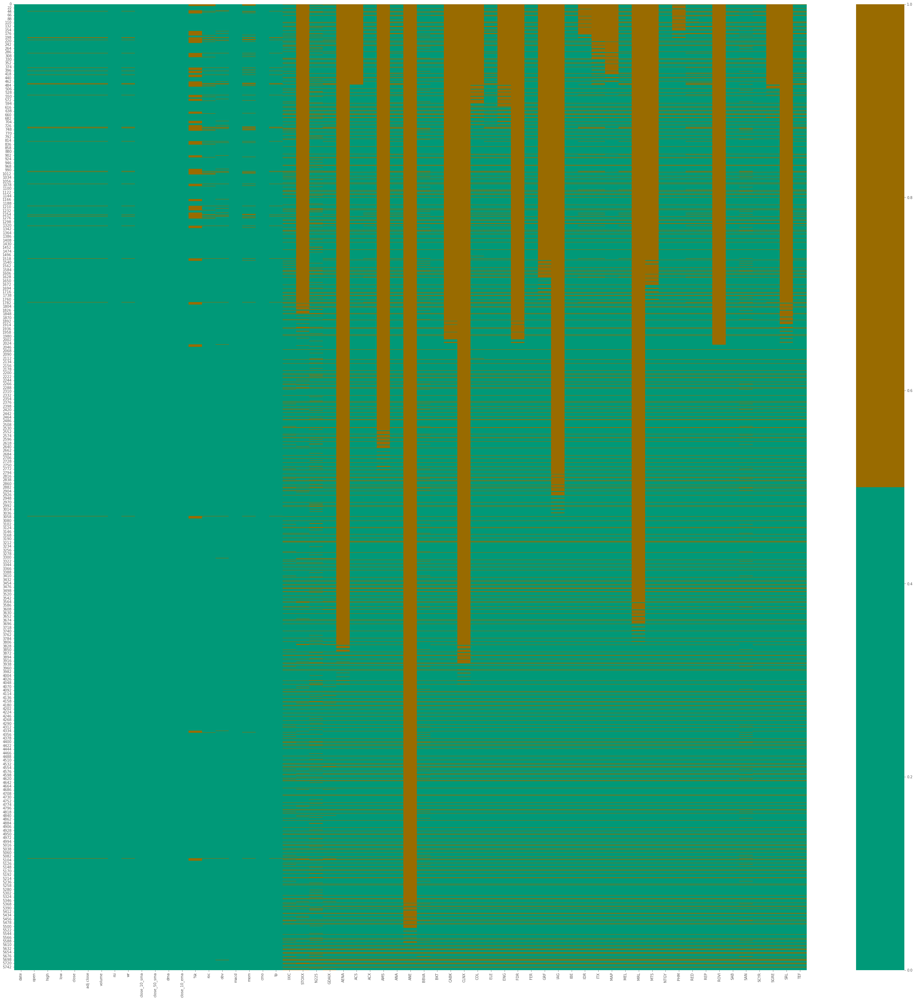

In [ ]:
#Se muestran graficamente los posibles nulls
plt.style.use('ggplot')
from matplotlib.pyplot import figure
matplotlib.rcParams['figure.figsize'] = (50,50)
colours = ['#009978', '#996b00'] # specify the colours - orange is missing. green is not missing.
sns.heatmap(df_sin_limpiar.isnull(), cmap=sns.color_palette(colours))

In [ ]:
revisar_nulls(df_sin_limpiar)

open - 1%
high - 1%
low - 1%
close - 1%
adj close - 1%
volume - 1%
rsi - 0%
wr - 1%
%k - 10%
roc - 2%
obv - 2%
mom - 2%
cmo - 0%
tp - 1%
IXIC - 14%
STOXX - 41%
N225 - 16%
GDAIX - 13%
AENA - 71%
ACS - 19%
ACX - 12%
AMS - 52%
ANA - 13%
ANE - 96%
BBVA - 14%
BKT - 12%
CABK - 42%
CLNX - 72%
COL - 21%
ELE - 13%
ENG - 21%
FDR - 42%
FER - 12%
GRF - 37%
IAG - 57%
IBE - 12%
IDR - 15%
ITX - 17%
MAP - 18%
MEL - 13%
MRL - 68%
MTS - 37%
NTGY - 12%
PHM - 14%
RED - 13%
REP - 13%
ROVI - 43%
SAB - 12%
SAN - 14%
SCYR - 12%
SGRE - 19%
SRL - 41%
TEF - 13%


In [ ]:
#Se calcula el numero exacto de valores missing
from statistics import median
from math import isnan
from itertools import filterfalse
from numpy import mean, ptp, var, std
#sum(map(isnan, df_final['date']))
print(sum(map(isnan, df_sin_limpiar['open'])))
print(sum(map(isnan, df_sin_limpiar['high'])))
print(sum(map(isnan, df_sin_limpiar['low'])))
print(sum(map(isnan, df_sin_limpiar['close'])))
print(sum(map(isnan, df_sin_limpiar['adj close'])))
print(sum(map(isnan, df_sin_limpiar['volume'])))
#sum(map(isnan, df_final['ticker']))
print(sum(map(isnan, df_sin_limpiar['rsi'])))
print(sum(map(isnan, df_sin_limpiar['wr'])))
print(sum(map(isnan, df_sin_limpiar['close_10_sma'])))
print(sum(map(isnan, df_sin_limpiar['close_50_sma'])))
print(sum(map(isnan, df_sin_limpiar['dma'])))
print(sum(map(isnan, df_sin_limpiar['close_10_ema'])))
print(sum(map(isnan, df_sin_limpiar['%k'])))
print(sum(map(isnan, df_sin_limpiar['roc'])))
print(sum(map(isnan, df_sin_limpiar['obv'])))
print(sum(map(isnan, df_sin_limpiar['macd'])))
print(sum(map(isnan, df_sin_limpiar['mom'])))
print(sum(map(isnan, df_sin_limpiar['cmo'])))
print(sum(map(isnan, df_sin_limpiar['tp'])))
print(sum(map(isnan, df_sin_limpiar['STOXX'])))
print(sum(map(isnan, df_sin_limpiar['GDAIX'])))
print(sum(map(isnan, df_sin_limpiar['IXIC'])))
print(sum(map(isnan, df_sin_limpiar['N225'])))
print(sum(map(isnan, df_sin_limpiar['ACS'])))
print(sum(map(isnan, df_sin_limpiar['ACX'])))
print(sum(map(isnan, df_sin_limpiar['AENA'])))
print(sum(map(isnan, df_sin_limpiar['IAG'])))
print(sum(map(isnan, df_sin_limpiar['AMS'])))
print(sum(map(isnan, df_sin_limpiar['ANA'])))
print(sum(map(isnan, df_sin_limpiar['BBVA'])))
print(sum(map(isnan, df_sin_limpiar['ANE'])))
print(sum(map(isnan, df_sin_limpiar['BKT'])))
print(sum(map(isnan, df_sin_limpiar['CABK'])))
print(sum(map(isnan, df_sin_limpiar['CLNX'])))
print(sum(map(isnan, df_sin_limpiar['COL'])))
print(sum(map(isnan, df_sin_limpiar['ELE'])))
print(sum(map(isnan, df_sin_limpiar['ENG'])))
print(sum(map(isnan, df_sin_limpiar['FDR'])))
print(sum(map(isnan, df_sin_limpiar['FER'])))
print(sum(map(isnan, df_sin_limpiar['GRF'])))
print(sum(map(isnan, df_sin_limpiar['IBE'])))
print(sum(map(isnan, df_sin_limpiar['IDR'])))
print(sum(map(isnan, df_sin_limpiar['ITX'])))
print(sum(map(isnan, df_sin_limpiar['MAP'])))
print(sum(map(isnan, df_sin_limpiar['MEL'])))
print(sum(map(isnan, df_sin_limpiar['MRL'])))
print(sum(map(isnan, df_sin_limpiar['MTS'])))
print(sum(map(isnan, df_sin_limpiar['NTGY'])))
print(sum(map(isnan, df_sin_limpiar['PHM'])))
print(sum(map(isnan, df_sin_limpiar['RED'])))
print(sum(map(isnan, df_sin_limpiar['ROVI'])))
print(sum(map(isnan, df_sin_limpiar['SAB'])))
print(sum(map(isnan, df_sin_limpiar['SAN'])))
print(sum(map(isnan, df_sin_limpiar['SCYR'])))
print(sum(map(isnan, df_sin_limpiar['SGRE'])))
print(sum(map(isnan, df_sin_limpiar['SRL'])))
print(sum(map(isnan, df_sin_limpiar['TEF'])))

63
63
63
63
63
63
1
63
0
0
0
0
550
132
115
0
136
1
63
2364
728
799
946
1092
688
4096
3258
3013
735
798
5552
676
2429
4149
1215
735
1235
2429
677
2109
672
853
995
1033
729
3942
2148
668
802
737
2466
676
798
676
1115
2351
725


In [ ]:
#Se eliminan los atributos que tengan 40% de sus valores nulls
df_sin_limpiar = df_sin_limpiar.drop(['STOXX','AENA','AMS','ANE','CLNX','FDR','IAG','MRL','ROVI','SRL'],1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


In [ ]:
#Se asigna por defecto el valor de la medina cuando el campo esta vacío
mediana = df_sin_limpiar['open'].median()
df_sin_limpiar['open'] = df_sin_limpiar['open'].fillna(mediana)

mediana = df_sin_limpiar['high'].median()
df_sin_limpiar['high'] = df_sin_limpiar['high'].fillna(mediana)

mediana = df_sin_limpiar['low'].median()
df_sin_limpiar['low'] = df_sin_limpiar['low'].fillna(mediana)

media = df_sin_limpiar['close'].median()
df_sin_limpiar['close'] = df_sin_limpiar['close'].fillna(media)

media = df_sin_limpiar['adj close'].median()
df_sin_limpiar['adj close'] = df_sin_limpiar['adj close'].fillna(media)


media = df_sin_limpiar['volume'].median()
df_sin_limpiar['volume'] = df_sin_limpiar['volume'].fillna(media)

media = df_sin_limpiar['rsi'].median()
df_sin_limpiar['rsi'] = df_sin_limpiar['rsi'].fillna(media)

media = df_sin_limpiar['close_10_sma'].median()
df_sin_limpiar['close_10_sma'] = df_sin_limpiar['close_10_sma'].fillna(media)

media = df_sin_limpiar['close_50_sma'].median()
df_sin_limpiar['close_50_sma'] = df_sin_limpiar['close_50_sma'].fillna(media)

media = df_sin_limpiar['dma'].median()
df_sin_limpiar['dma'] = df_sin_limpiar['dma'].fillna(media)

media = df_sin_limpiar['obv'].median()
df_sin_limpiar['obv'] = df_sin_limpiar['obv'].fillna(media)

media = df_sin_limpiar['%k'].median()
df_sin_limpiar['%k'] = df_sin_limpiar['%k'].fillna(media)

media = df_sin_limpiar['roc'].median()
df_sin_limpiar['roc'] = df_sin_limpiar['roc'].fillna(media)

media = df_sin_limpiar['macd'].median()
df_sin_limpiar['macd'] = df_sin_limpiar['macd'].fillna(media)

media = df_sin_limpiar['mom'].median()
df_sin_limpiar['mom'] = df_sin_limpiar['mom'].fillna(media)

media = df_sin_limpiar['cmo'].median()
df_sin_limpiar['cmo'] = df_sin_limpiar['cmo'].fillna(media)

media = df_sin_limpiar['tp'].median()
df_sin_limpiar['tp'] = df_sin_limpiar['tp'].fillna(media)

media = df_sin_limpiar['IXIC'].median()
df_sin_limpiar['IXIC'] = df_sin_limpiar['IXIC'].fillna(media)

#media = df_sin_limpiar['STOXX'].median()
#df_sin_limpiar['STOXX'] = df_sin_limpiar['STOXX'].fillna(media)

media = df_sin_limpiar['N225'].median()
df_sin_limpiar['N225'] = df_sin_limpiar['N225'].fillna(media)

media = df_sin_limpiar['GDAIX'].median()
df_sin_limpiar['GDAIX'] = df_sin_limpiar['GDAIX'].fillna(media)

media = df_sin_limpiar['ACS'].median()
df_sin_limpiar['ACS'] = df_sin_limpiar['ACS'].fillna(media)

media = df_sin_limpiar['ACX'].median()
df_sin_limpiar['ACX'] = df_sin_limpiar['ACX'].fillna(media)

media = df_sin_limpiar['ANA'].median()
df_sin_limpiar['ANA'] = df_sin_limpiar['ANA'].fillna(media)

media = df_sin_limpiar['CABK'].median()
df_sin_limpiar['CABK'] = df_sin_limpiar['CABK'].fillna(media)

#media = df_final['COL'].median()
#df_sin_limpiar['COL'] = df_sin_limpiar['COL'].fillna(media)

media = df_sin_limpiar['BBVA'].median()
df_sin_limpiar['BBVA'] = df_sin_limpiar['BBVA'].fillna(media)

media = df_sin_limpiar['BKT'].median()
df_sin_limpiar['BKT'] = df_sin_limpiar['BKT'].fillna(media)

media = df_sin_limpiar['ELE'].median()
df_sin_limpiar['ELE'] = df_sin_limpiar['ELE'].fillna(media)

media = df_sin_limpiar['ENG'].median()
df_sin_limpiar['ENG'] = df_sin_limpiar['ENG'].fillna(media)

#media = df_sin_limpiar['FDR'].median()
#df_sin_limpiar['FDR'] = df_sin_limpiar['FDR'].fillna(media)

media = df_sin_limpiar['FER'].median()
df_sin_limpiar['FER'] = df_sin_limpiar['FER'].fillna(media)

media = df_sin_limpiar['GRF'].median()
df_sin_limpiar['GRF'] = df_sin_limpiar['GRF'].fillna(media)

#media = df_final['IAG'].median()
#df_final['IAG'] = df_final['IAG'].fillna(media)

media = df_sin_limpiar['IBE'].median()
df_sin_limpiar['IBE'] = df_sin_limpiar['IBE'].fillna(media)

media = df_sin_limpiar['IDR'].median()
df_sin_limpiar['IDR'] = df_sin_limpiar['IDR'].fillna(media)

media = df_sin_limpiar['ITX'].median()
df_sin_limpiar['ITX'] = df_sin_limpiar['ITX'].fillna(media)

media = df_sin_limpiar['MAP'].median()
df_sin_limpiar['MAP'] = df_sin_limpiar['MAP'].fillna(media)

media = df_sin_limpiar['MEL'].median()
df_sin_limpiar['MEL'] = df_sin_limpiar['MEL'].fillna(media)

#media = df_final['MRL'].median()
#df_final['MRL'] = df_final['MRL'].fillna(media)

media = df_sin_limpiar['MTS'].median()
df_sin_limpiar['MTS'] = df_sin_limpiar['MTS'].fillna(media)

media = df_sin_limpiar['NTGY'].median()
df_sin_limpiar['NTGY'] = df_sin_limpiar['NTGY'].fillna(media)

media = df_sin_limpiar['PHM'].median()
df_sin_limpiar['PHM'] = df_sin_limpiar['PHM'].fillna(media)

media = df_sin_limpiar['RED'].median()
df_sin_limpiar['RED'] = df_sin_limpiar['RED'].fillna(media)

media = df_sin_limpiar['REP'].median()
df_sin_limpiar['REP'] = df_sin_limpiar['REP'].fillna(media)

#media = df_sin_limpiar['ROVI'].median()
#df_sin_limpiar['ROVI'] = df_sin_limpiar['ROVI'].fillna(media)

media = df_sin_limpiar['SAB'].median()
df_sin_limpiar['SAB'] = df_sin_limpiar['SAB'].fillna(media)

media = df_sin_limpiar['SAN'].median()
df_sin_limpiar['SAN'] = df_sin_limpiar['SAN'].fillna(media)

media = df_sin_limpiar['SCYR'].median()
df_sin_limpiar['SCYR'] = df_sin_limpiar['SCYR'].fillna(media)

media = df_sin_limpiar['SGRE'].median()
df_sin_limpiar['SGRE'] = df_sin_limpiar['SGRE'].fillna(media)

media = df_sin_limpiar['COL'].median()
df_sin_limpiar['COL'] = df_sin_limpiar['COL'].fillna(media)

#media = df_sin_limpiar['SRL'].median()
#df_sin_limpiar['SRL'] = df_sin_limpiar['SRL'].fillna(media)

media = df_sin_limpiar['TEF'].median()
df_sin_limpiar['TEF'] = df_sin_limpiar['TEF'].fillna(media)

media = df_sin_limpiar['wr'].median()
df_sin_limpiar['wr'] = df_sin_limpiar['wr'].fillna(media)

In [ ]:
#Se comprueba que ya no hay nulos
revisar_nulls(df_sin_limpiar)

In [ ]:
#Se comprueba que no hay duplicados
df_sin_limpiar.shape
df_sin_limpiar = df_sin_limpiar.drop_duplicates()
df_sin_limpiar.shape

(5760, 49)

In [ ]:
df_sin_limpiar.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5760 entries, 0 to 5759
Data columns (total 49 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   date          5760 non-null   object 
 1   open          5760 non-null   float64
 2   high          5760 non-null   float64
 3   low           5760 non-null   float64
 4   close         5760 non-null   float64
 5   adj close     5760 non-null   float64
 6   volume        5760 non-null   float64
 7   rsi           5760 non-null   float64
 8   wr            5760 non-null   float64
 9   close_10_sma  5760 non-null   float64
 10  close_50_sma  5760 non-null   float64
 11  dma           5760 non-null   float64
 12  close_10_ema  5760 non-null   float64
 13  %k            5760 non-null   float64
 14  roc           5760 non-null   float64
 15  obv           5760 non-null   float64
 16  macd          5760 non-null   float64
 17  mom           5760 non-null   float64
 18  cmo           5760 non-null 

#Transformaciones

In [15]:
def calcularEuros(yen): 
  if yen != -1: 
    yen = round((yen * 0.0069), 2) 
  return yen 
 
df_final["N225"] = df_final["N225"].apply(calcularEuros) 
print(df_final["N225"].head(n=5))

0       NaN
1    136.53
2    137.50
3       NaN
4    121.54
Name: N225, dtype: float64


In [14]:
def calcularEuros(dolar): 
  if dolar != -1: 
    dolar = round((dolar * 0.98), 2) 
  return dolar 
 
df_final["NASDAQ"] = df_final["IXIC"].apply(calcularEuros) 
print(df_final["NASDAQ"].head(n=5))

0    4048.53
1    4126.76
2    4816.49
3        NaN
4    3912.09
Name: NASDAQ, dtype: float64


In [ ]:
#Se descarga el dataset
create_download_link(df_sin_limpiar)

#Exploracion de los datos

In [12]:
df_final = upload_files()
df_final.head()

Saving FINALFECHASACOTADOASUPLOAD.csv to FINALFECHASACOTADOASUPLOAD.csv
User uploaded file "FINALFECHASACOTADOASUPLOAD.csv" with length 2869119 bytes


,indice,date,open,high,low,close,adj close,volume,rsi,wr,...,PHM,RED,REP,ROVI,SAB,SAN,SCYR,SGRE,SRL,TEF
0,0,2000-01-03,12585.8,12702.4,12500.9,12538.7,12538.69,0.0,NaN,-81.240695,...,NaN,NaN,NaN,NaN,NaN,11.625,NaN,NaN,NaN,NaN
1,1,2000-02-03,12538.7,12711.6,12450.2,12709.6,12709.59,0.0,100.000000,-0.765111,...,NaN,NaN,NaN,NaN,NaN,10.500,NaN,NaN,NaN,NaN
2,2,2000-03-03,12709.6,12864.8,12315.3,12745.0,12744.99,0.0,100.000000,-21.801638,...,NaN,2.6300,18.93,NaN,2.756229,10.625,6.475437,NaN,NaN,31.835295
3,3,2000-06-03,12745.0,12852.9,12678.5,12816.8,12816.79,0.0,100.000000,-8.735214,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,2000-07-03,12816.8,12968.5,12654.2,12667.2,12667.19,0.0,61.003788,-46.126761,...,NaN,2.9325,20.90,NaN,2.756229,10.500,5.689715,NaN,NaN,23.233833


In [13]:
df_final = df_final.drop('indice',1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


In [6]:
df_final.shape

(5760, 7)

In [7]:
df_final.dtypes

date             object
open            float64
high            float64
low             float64
close           float64
adj close       float64
volume          float64
rsi             float64
wr              float64
close_10_sma    float64
close_50_sma    float64
dma             float64
close_10_ema    float64
%k              float64
roc             float64
obv             float64
macd            float64
mom             float64
cmo             float64
tp              float64
STOXX           float64
N225            float64
GDAIX           float64
ACS             float64
ACX             float64
ANA             float64
BBVA            float64
BKT             float64
CABK            float64
COL             float64
ELE             float64
ENG             float64
FDR             float64
FER             float64
GRF             float64
IBE             float64
IDR             float64
ITX             float64
MAP             float64
MEL             float64
MTS             float64
NTGY            

In [16]:
df1 = df_final.iloc[:, 0:10]
df1.describe()

,open,high,low,close,adj close,volume,rsi,wr,close_10_sma
count,5697.000000,5697.000000,5697.000000,5697.000000,5697.000000,5.697000e+03,5759.000000,5697.000000,5760.000000
mean,9594.473828,9666.143268,9510.241829,9590.768633,9590.761137,1.220883e+08,51.192281,-44.659139,9582.760679
std,1965.103742,1969.560459,1959.908258,1965.806206,1965.804696,1.313769e+08,11.810940,31.370935,1961.202099
min,5294.800000,5462.600000,5266.900000,5364.500000,5364.490000,0.000000e+00,8.468784,-100.000000,5482.670000
25%,8305.600000,8379.300000,8230.800000,8305.100000,8305.100000,1.722000e+05,43.017306,-72.791628,8311.850000
50%,9350.800000,9414.200000,9278.300000,9344.900000,9344.900000,1.237217e+08,51.158369,-42.310924,9342.140000
75%,10596.000000,10673.900000,10514.100000,10588.100000,10588.100000,2.160446e+08,59.454796,-14.740902,10585.492500
max,15999.200000,16040.400000,15868.600000,15945.700000,15945.680000,9.752120e+08,100.000000,-0.000000,15830.340000


In [23]:
df2 = df_final.iloc[:, 10:19]
df2.describe()

,close_50_sma,dma,close_10_ema,%k,roc,obv,macd,mom,cmo
count,5760.000000,5760.000000,5760.000000,5210.000000,5628.000000,5.645000e+03,5760.000000,5624.000000,5759.000000
mean,9597.323990,-14.563311,9582.698337,55.149255,0.005674,3.353975e+09,-4.964012,-8.235757,2.789285
std,1940.819304,402.544899,1958.034849,31.451009,4.661986,6.849601e+09,139.378342,398.808514,27.946276
min,5904.669388,-2312.620000,5501.109810,0.000000,-32.035745,-1.140225e+10,-856.619445,-2635.200000,-90.839706
25%,8305.010364,-205.693000,8309.921184,26.877013,-2.450344,2.181680e+07,-72.949083,-217.200000,-16.472612
50%,9339.983000,40.743000,9334.809345,57.473533,0.247773,3.932150e+07,14.997260,22.750000,2.725580
75%,10590.989000,233.260000,10587.589494,85.296023,2.756199,1.022504e+10,81.598463,238.575000,23.221025
max,15600.436735,926.128000,15782.088053,100.000000,24.554727,1.850175e+10,341.433739,1400.600000,100.000000


In [24]:
df3 = df_final.iloc[:, 19:28]
df3.describe()

,tp,IXIC,STOXX,N225,GDAIX,AENA,ACS,ACX,AMS
count,5697.000000,4961.000000,3396.000000,4814.000000,5032.000000,1664.000000,4668.000000,5072.000000,2747.000000
mean,9589.051243,4454.400000,3200.546201,106.891668,8147.082488,138.631496,26.983824,11.175981,41.044667
std,1964.502304,3415.783996,563.139393,39.184944,3437.956331,23.957137,9.024545,2.891542,19.516786
min,5392.366667,1114.109985,1809.980000,48.890000,2202.960000,79.099998,8.856650,5.822000,11.575000
25%,8302.700000,2137.649902,2800.110000,72.512500,5507.162500,122.599998,21.397500,9.050000,23.897500
50%,9352.866667,2839.959961,3192.580000,101.805000,7183.555000,139.125000,28.122499,10.930000,40.535000
75%,10595.933333,5328.669922,3553.397500,134.472500,11174.577500,159.825001,33.722501,12.550000,58.880001
max,15910.133333,16057.440430,4557.570000,211.620000,16251.130000,183.699997,49.779999,23.330000,82.059998


In [25]:
df4 = df_final.iloc[:, 28:37]
df4.describe()

,ANA,ANE,BBVA,BKT,CABK,CLNX,COL,ELE,ENG
count,5025.000000,208.000000,4962.000000,5084.000000,3331.000000,1611.000000,4545.000000,5025.000000,4525.000000
mean,81.602594,31.995048,11.236058,8.254732,3.349238,28.671775,163.434118,20.811586,17.985527
std,41.271832,3.480307,5.159462,10.164432,0.838275,14.886764,350.999169,6.011015,5.678428
min,30.469999,26.330000,2.490000,1.400000,1.522000,11.114292,1.989776,8.950000,5.140000
25%,49.959999,29.647500,7.132500,3.837580,2.661500,14.302710,6.700000,17.190001,14.250000
50%,69.489998,30.885000,10.303282,5.539000,3.355000,20.650902,9.900000,19.469999,18.275000
75%,94.900002,34.385001,13.575148,6.998205,3.995000,43.227894,132.837036,22.790001,22.889999
max,235.250000,42.740002,25.384150,67.063591,5.270000,61.080002,1856.383667,40.639999,28.475000


In [26]:
df5 = df_final.iloc[:, 37:46]
df5.describe()

,FDR,FER,GRF,IAG,IBE,IDR,ITX,MAP,MEL
count,3331.000000,5083.000000,3651.000000,2502.000000,5088.000000,4907.000000,4765.000000,4727.000000,5031.000000
mean,7.751106,16.455751,15.472009,4.545163,6.197879,11.674308,16.282760,2.437376,8.442560
std,8.231778,7.239342,7.989614,2.326453,2.299116,3.392070,10.452160,0.598417,3.238241
min,1.840000,3.110000,2.619000,0.998400,2.654000,5.060000,3.060000,1.111635,1.670000
25%,2.700000,10.000000,7.087500,2.029000,4.197500,9.295500,6.014000,1.951318,5.980000
50%,3.465000,16.594999,16.475000,4.727000,5.902000,10.735000,13.312000,2.486000,8.090000
75%,11.000000,21.840000,22.480000,6.814500,7.109500,14.050000,26.400000,2.876358,10.955000
max,38.000000,38.480000,34.189999,8.694000,12.410000,20.730000,36.665001,4.079306,19.000000


In [27]:
df6 = df_final.iloc[:,46:55]
df6.describe()

,MRL,MTS,NTGY,PHM,RED,REP,ROVI,SAB,SAN
count,1818.000000,3612.000000,5092.000000,4958.000000,5023.000000,5029.000000,3294.000000,5084.000000,4962.000000
mean,10.303008,35.478354,19.001292,57.447357,10.827533,16.889441,16.640586,2.107298,9.043486
std,1.582414,26.467919,5.541165,37.236987,5.972208,4.745064,15.496799,1.078579,4.503903
min,5.730000,5.335783,8.490000,11.034044,2.017500,5.226000,3.800000,0.254600,1.790000
25%,9.288000,19.452427,15.397271,31.080124,5.868750,13.790000,6.550000,1.370301,5.630000
50%,10.380000,25.239345,17.992354,49.200195,9.445000,16.549999,12.150000,1.959640,8.370000
75%,11.500000,47.919751,21.750000,73.200294,17.250000,19.950001,17.299999,2.682137,11.507500
max,13.410000,135.074112,38.450600,302.281219,20.549999,30.290001,73.800003,5.527278,22.240000


In [28]:
df7 = df_final.iloc[:,55:66]
df7.describe()

,SCYR,SGRE,SRL,TEF,NASDAQ
count,5084.000000,4645.000000,3409.000000,5035.000000,4961.000000
mean,7.474670,13.348475,5.188844,11.992386,4365.312004
std,8.065990,7.757258,6.304032,4.732773,3347.468351
min,0.899522,1.006000,0.300000,2.794000,1091.830000
25%,2.242000,7.151000,0.910000,8.932500,2094.900000
50%,4.203283,12.250000,1.900000,11.967895,2783.160000
75%,8.986674,17.334999,6.680000,15.047614,5222.100000
max,46.446651,38.480000,30.940001,31.835295,15736.290000


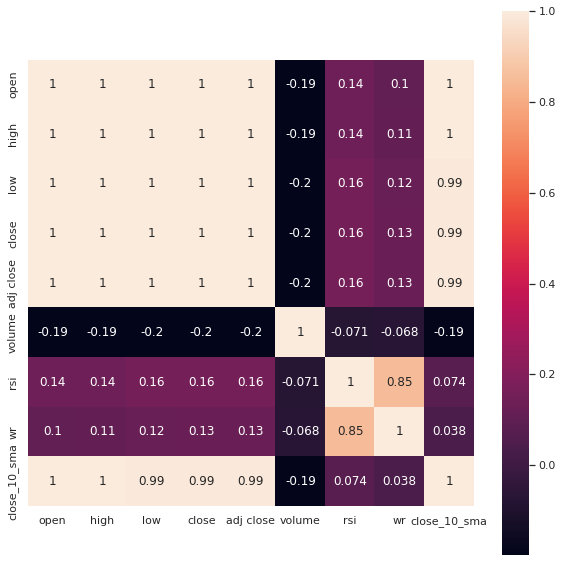

In [70]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
sns.heatmap(df1.corr(), square=True, annot=True)

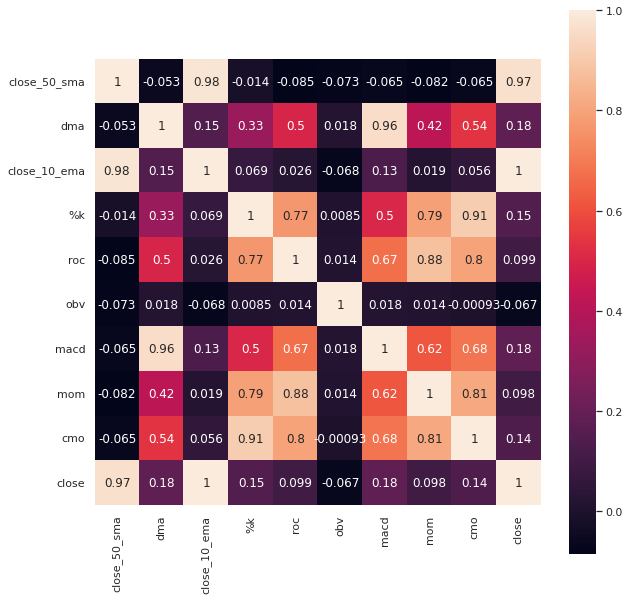

In [71]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
df2['close'] = df_final['close']
sns.heatmap(df2.corr(), square=True, annot=True)

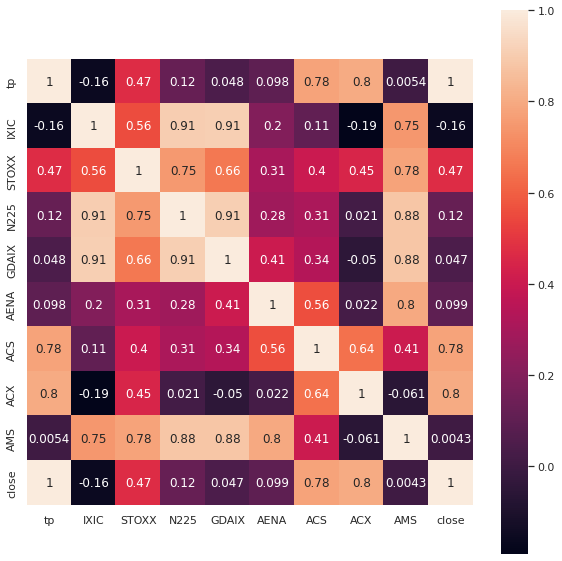

In [72]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
df3['close'] = df_final['close']
sns.heatmap(df3.corr(), square=True, annot=True)

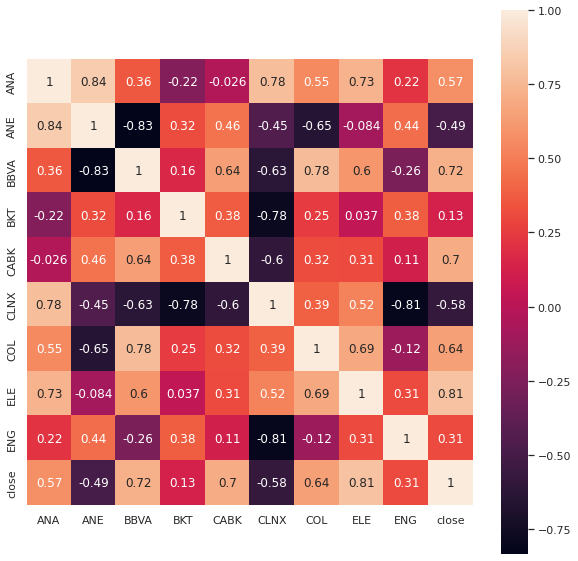

In [73]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
df4['close'] = df_final['close']
sns.heatmap(df4.corr(), square=True, annot=True)

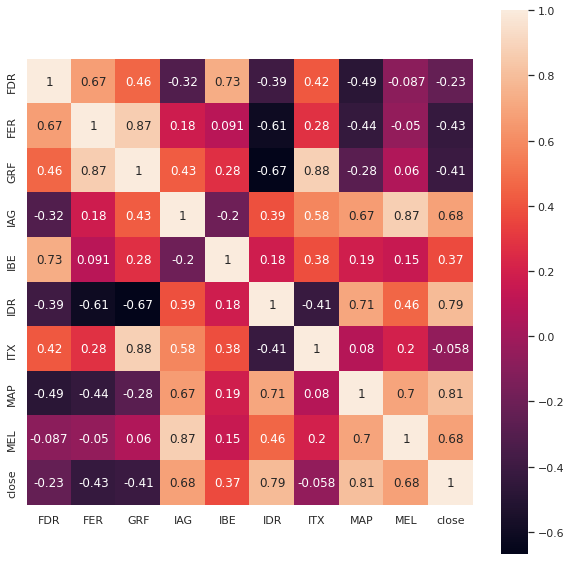

In [74]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
df5['close'] = df_final['close']
sns.heatmap(df5.corr(), square=True, annot=True)

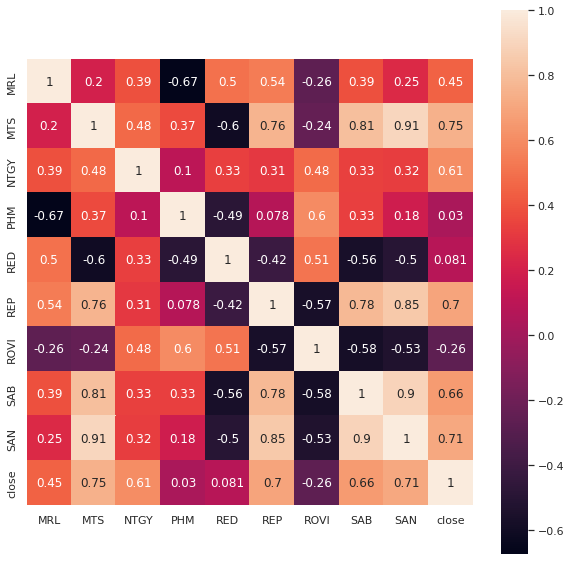

In [75]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
df6['close'] = df_final['close']
sns.heatmap(df6.corr(), square=True, annot=True)

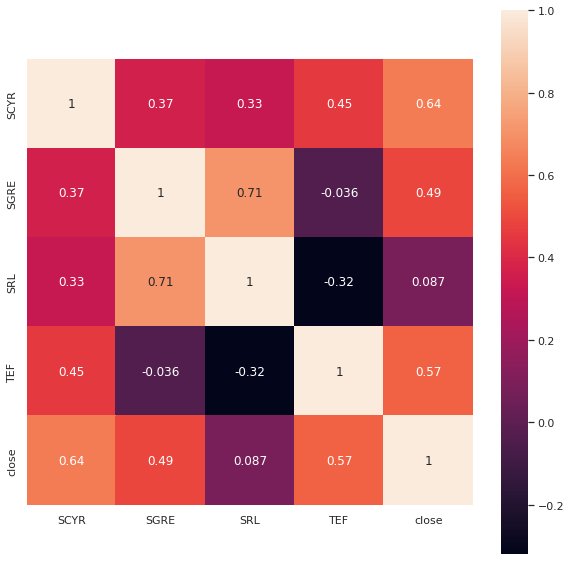

In [69]:
matplotlib.rcParams['figure.figsize'] = (10,10)
sns.set()
df7['close'] = df_final['close']
sns.heatmap(df7.corr(), square=True, annot=True)

In [30]:
df_final.head()

,date,open,high,low,close,adj close,volume,rsi,wr,close_10_sma,...,RED,REP,ROVI,SAB,SAN,SCYR,SGRE,SRL,TEF,NASDAQ
0,2000-01-03,12585.8,12702.4,12500.9,12538.7,12538.69,0.0,NaN,-81.240695,12538.700000,...,NaN,NaN,NaN,NaN,11.625,NaN,NaN,NaN,NaN,4048.53
1,2000-02-03,12538.7,12711.6,12450.2,12709.6,12709.59,0.0,100.000000,-0.765111,12624.150000,...,NaN,NaN,NaN,NaN,10.500,NaN,NaN,NaN,NaN,4126.76
2,2000-03-03,12709.6,12864.8,12315.3,12745.0,12744.99,0.0,100.000000,-21.801638,12664.433333,...,2.6300,18.93,NaN,2.756229,10.625,6.475437,NaN,NaN,31.835295,4816.49
3,2000-06-03,12745.0,12852.9,12678.5,12816.8,12816.79,0.0,100.000000,-8.735214,12702.525000,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2000-07-03,12816.8,12968.5,12654.2,12667.2,12667.19,0.0,61.003788,-46.126761,12695.460000,...,2.9325,20.90,NaN,2.756229,10.500,5.689715,NaN,NaN,23.233833,3912.09


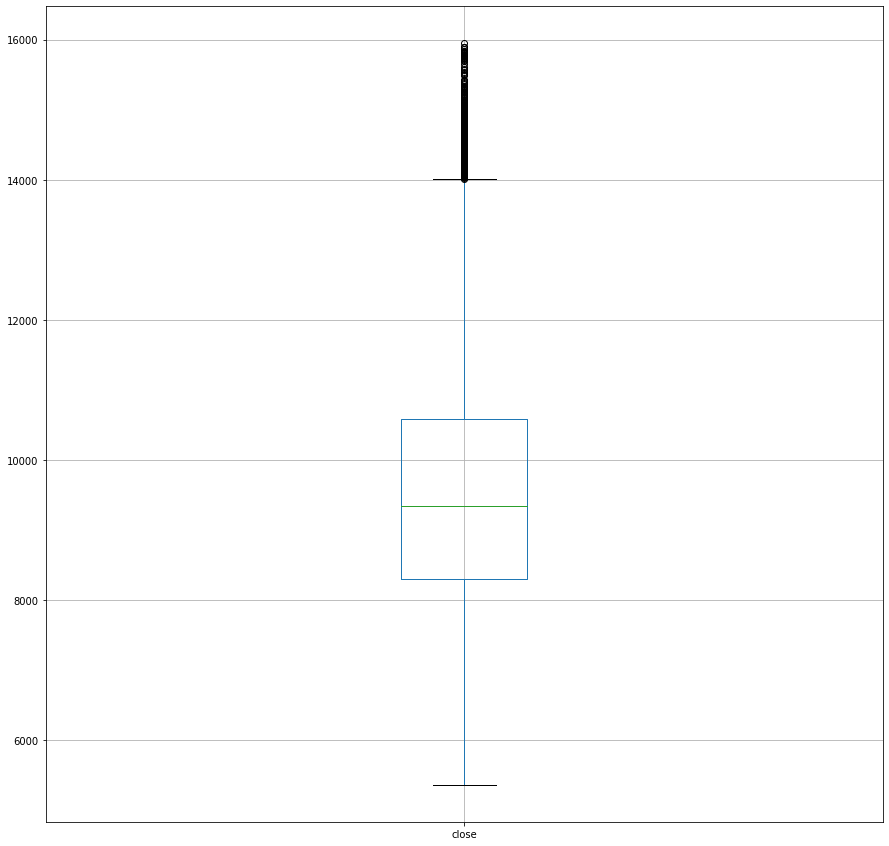

In [40]:
matplotlib.rcParams['figure.figsize'] = (15,15)
df1.boxplot(column=["close"])

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


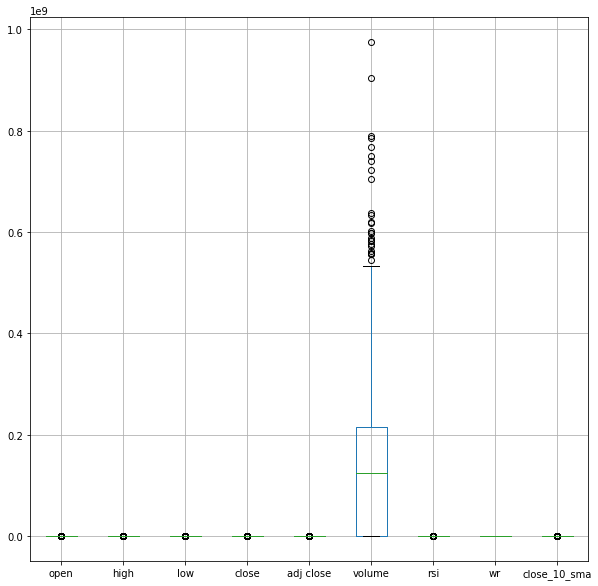

In [44]:
matplotlib.rcParams['figure.figsize'] = (10,10)
df1.boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


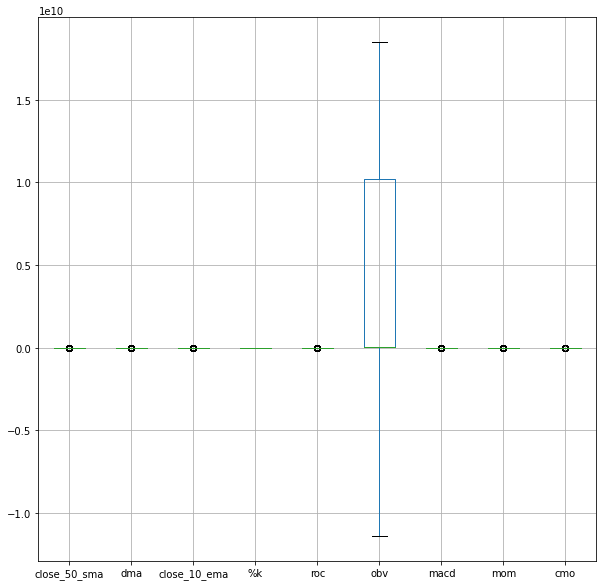

In [45]:
df2.boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


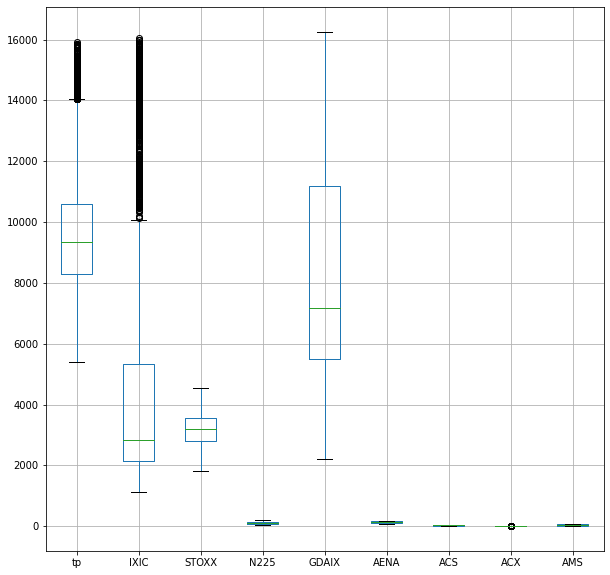

In [46]:
df3.boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


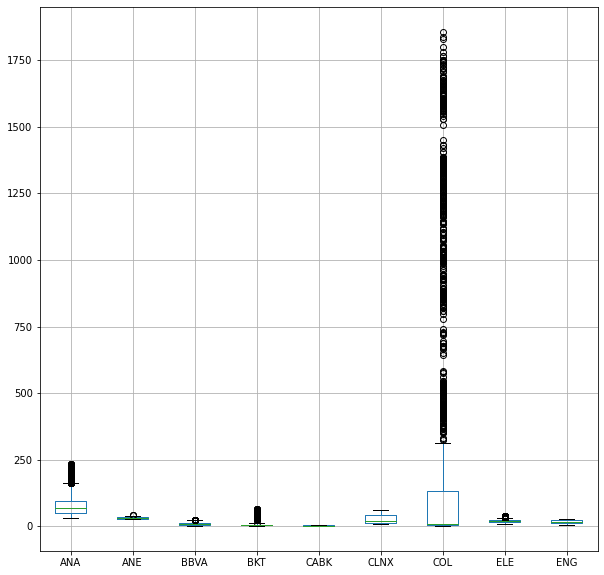

In [47]:
df4.boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


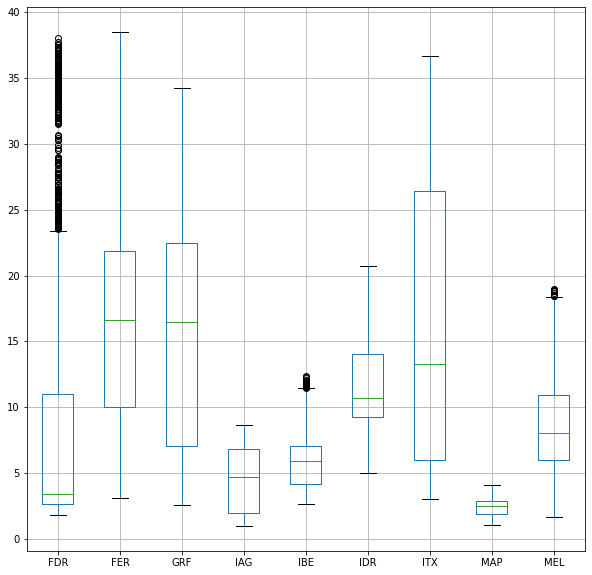

In [48]:
df5.boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


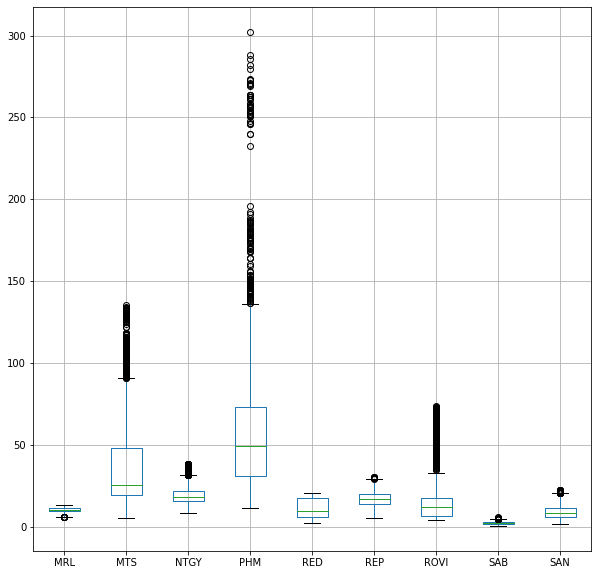

In [49]:
df6.boxplot()

/usr/local/lib/python3.7/dist-packages/matplotlib/cbook/__init__.py:1376: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  X = np.atleast_1d(X.T if isinstance(X, np.ndarray) else np.asarray(X))


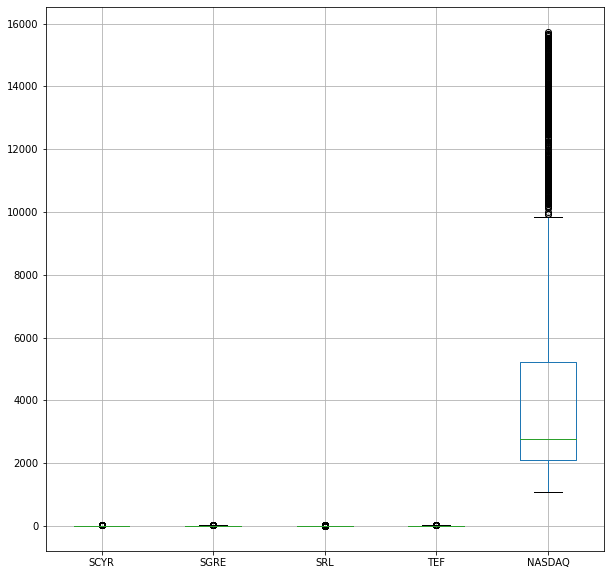

In [50]:
df7.boxplot()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd9182728d0>,
      dtype=object)

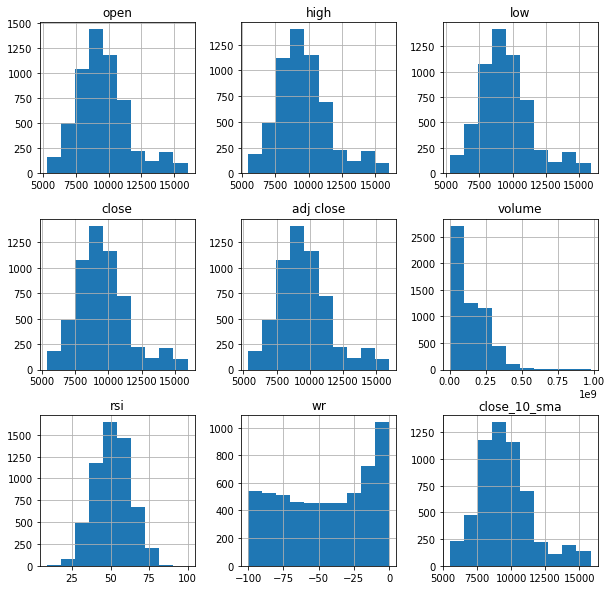

In [51]:
df1.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd91752f6d0>,
      dtype=object)

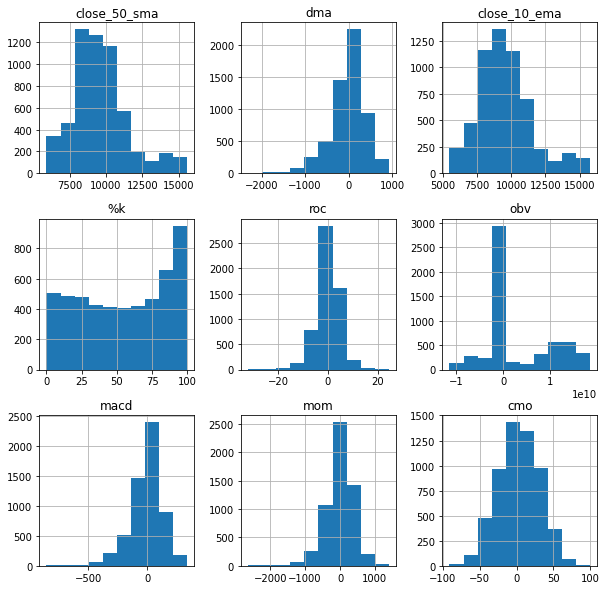

In [52]:
df2.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd917090ed0>,
      dtype=object)

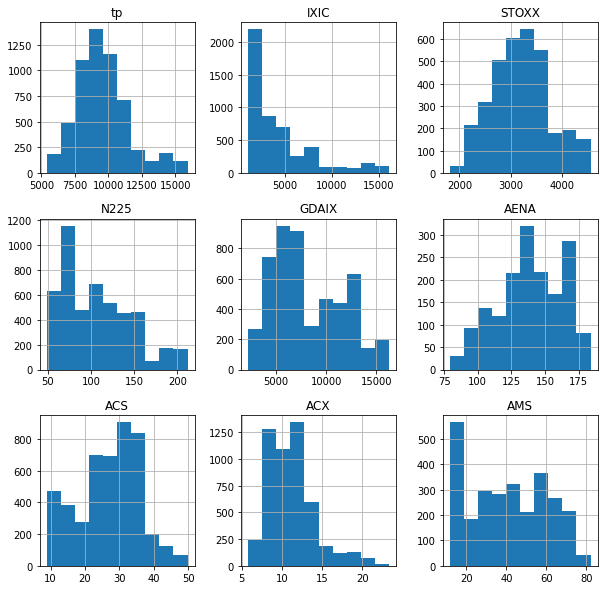

In [53]:
df3.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd916abead0>,
      dtype=object)

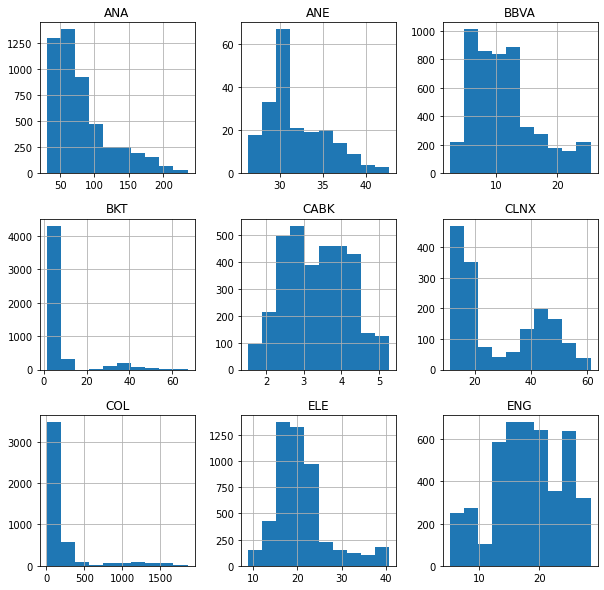

In [54]:
df4.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd917090450>,
      dtype=object)

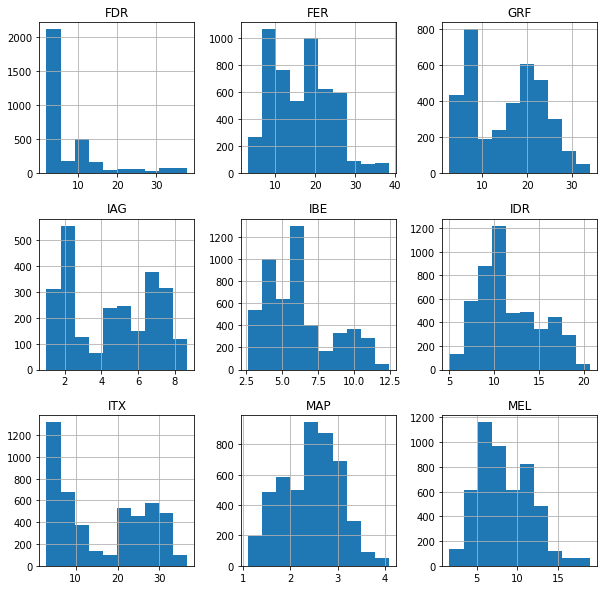

In [55]:
df5.hist()

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd916242f10>,
      dtype=object)

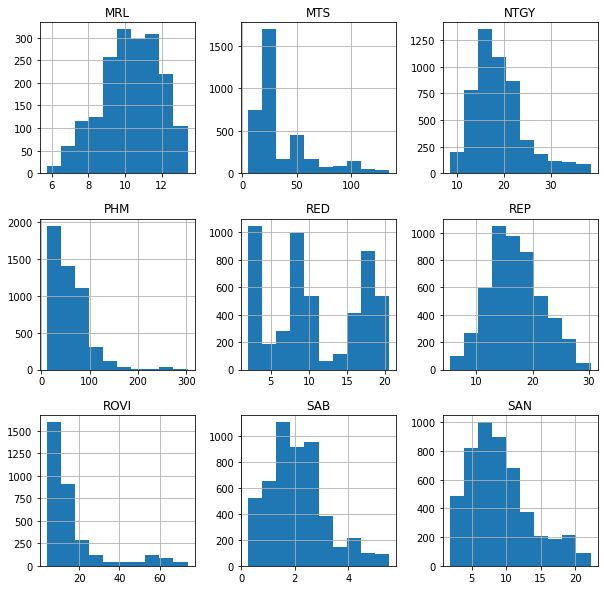

In [56]:
df6.hist()

In [57]:
df7 = df7.drop('NASDAQ',1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd913173ad0>,
      dtype=object)

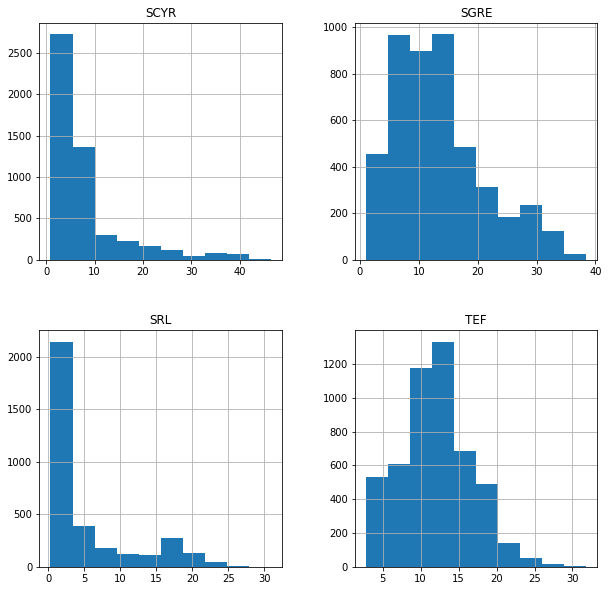

In [65]:
df7.hist()

In [8]:
df = upload_files()

Saving FINALFECHASACOTADOASUPLOAD.csv to FINALFECHASACOTADOASUPLOAD.csv
User uploaded file "FINALFECHASACOTADOASUPLOAD.csv" with length 2869119 bytes


In [9]:
df.dtypes

indice            int64
date             object
open            float64
high            float64
low             float64
close           float64
adj close       float64
volume          float64
rsi             float64
wr              float64
close_10_sma    float64
close_50_sma    float64
dma             float64
close_10_ema    float64
%k              float64
roc             float64
obv             float64
macd            float64
mom             float64
cmo             float64
tp              float64
IXIC            float64
STOXX           float64
N225            float64
GDAIX           float64
AENA            float64
ACS             float64
ACX             float64
AMS             float64
ANA             float64
ANE             float64
BBVA            float64
BKT             float64
CABK            float64
CLNX            float64
COL             float64
ELE             float64
ENG             float64
FDR             float64
FER             float64
GRF             float64
IAG             

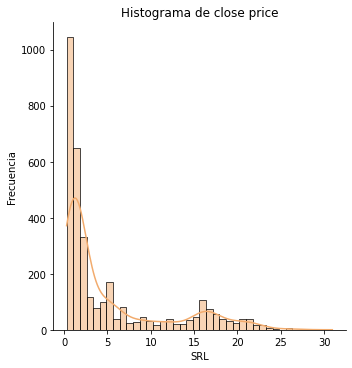

In [27]:
import matplotlib.pyplot as plot
import seaborn as sb

sb.displot(df['SRL'], color='#F2AB6D',  kde=True) #creamos el gráfico en Seaborn

#configuramos en Matplotlib
plot.ylabel('Frecuencia')
plot.title('Histograma de close price')

plot.show()

In [ ]:
pip install sweetviz

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.1 MB 25.3 MB/s 


In [ ]:
#Se crea informe de los datis
import warnings
import sweetviz as sw

warnings.filterwarnings('ignore')

reporte_completo = sw.analyze(df_final)
reporte_completo.show_html(filepath='reporte_completo.html', 
            open_browser=True, 
            layout='vertical', 
            scale=None)

                                             |          | [  0%]   00:00 -> (? left)

Report reporte_completo.html was generated! NOTEBOOK/COLAB USERS: the web browser MAY not pop up, regardless, the report IS saved in your notebook/colab files.


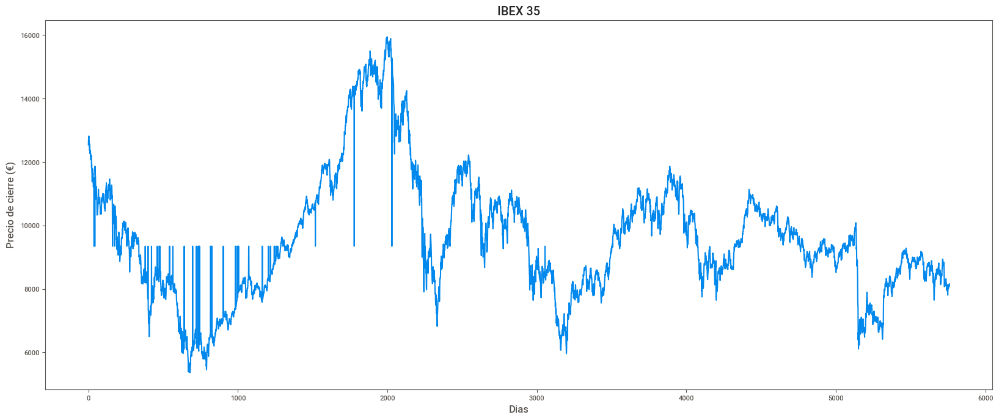

In [ ]:
#Visualizar el close price del ibex
plt.figure(figsize=(20,8))
plt.title('IBEX 35')
plt.xlabel('Dias')
plt.ylabel('Precio de cierre (€)')
plt.plot(df_final['close'])
plt.show()

#Division train y test

In [ ]:
df_final = upload_files()
df_final = df_final.drop('indice',1)
df_final.head()

Saving FINALSELECCIONADASCORRELACIONSINNULLS.csv to FINALSELECCIONADASCORRELACIONSINNULLS.csv
User uploaded file "FINALSELECCIONADASCORRELACIONSINNULLS.csv" with length 1389999 bytes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


,date,open,high,low,close,adj close,close_10_sma,close_50_sma,close_10_ema,tp,...,IDR,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF
0,2000-01-03,12585.8,12702.4,12500.9,12538.7,12538.69,12538.700000,12538.700000,12538.700000,12580.666667,...,10.735,2.486,8.09,25.239345,19.042200,16.549999,1.959640,11.625,4.203284,11.967895
1,2000-02-03,12538.7,12711.6,12450.2,12709.6,12709.59,12624.150000,12624.150000,12632.695000,12623.800000,...,10.735,2.486,12.00,25.239345,16.734312,16.549999,1.959640,10.500,4.203284,11.967895
2,2000-03-03,12709.6,12864.8,12315.3,12745.0,12744.99,12664.433333,12664.433333,12677.840864,12641.700000,...,10.735,2.486,12.49,25.239345,18.650455,18.930000,2.756229,10.625,6.475437,31.835295
3,2000-06-03,12745.0,12852.9,12678.5,12816.8,12816.79,12702.525000,12702.525000,12723.621708,12782.733333,...,10.735,2.486,8.09,25.239345,17.992354,16.549999,1.959640,8.370,4.203284,11.967895
4,2000-07-03,12816.8,12968.5,12654.2,12667.2,12667.19,12695.460000,12695.460000,12707.424570,12763.300000,...,10.735,2.486,11.40,25.239345,16.453279,20.900000,2.756229,10.500,5.689715,23.233833


In [ ]:
df_final = df_final.set_index(pd.DatetimeIndex(df_final['date'].values))
df_final.head()

,date,open,high,low,close,adj close,close_10_sma,close_50_sma,close_10_ema,tp,...,IDR,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF
2000-01-03,2000-01-03,12585.8,12702.4,12500.9,12538.7,12538.69,12538.700000,12538.700000,12538.700000,12580.666667,...,10.735,2.486,8.09,25.239345,19.042200,16.549999,1.959640,11.625,4.203284,11.967895
2000-02-03,2000-02-03,12538.7,12711.6,12450.2,12709.6,12709.59,12624.150000,12624.150000,12632.695000,12623.800000,...,10.735,2.486,12.00,25.239345,16.734312,16.549999,1.959640,10.500,4.203284,11.967895
2000-03-03,2000-03-03,12709.6,12864.8,12315.3,12745.0,12744.99,12664.433333,12664.433333,12677.840864,12641.700000,...,10.735,2.486,12.49,25.239345,18.650455,18.930000,2.756229,10.625,6.475437,31.835295
2000-06-03,2000-06-03,12745.0,12852.9,12678.5,12816.8,12816.79,12702.525000,12702.525000,12723.621708,12782.733333,...,10.735,2.486,8.09,25.239345,17.992354,16.549999,1.959640,8.370,4.203284,11.967895
2000-07-03,2000-07-03,12816.8,12968.5,12654.2,12667.2,12667.19,12695.460000,12695.460000,12707.424570,12763.300000,...,10.735,2.486,11.40,25.239345,16.453279,20.900000,2.756229,10.500,5.689715,23.233833


In [ ]:
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(df_final, train_size=0.75, random_state=0)

In [ ]:
print(df_train.shape)
print(df_test.shape)

(4320, 26)
(1440, 26)


In [ ]:
df_train['date'] = pd.DatetimeIndex(df_train['date'])
df_train.head()

,date,open,high,low,close,adj close,close_10_sma,close_50_sma,close_10_ema,tp,...,IDR,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF
2010-05-28,2010-05-28,9452.1,9492.1,9372.2,9425.5,9425.49,9306.33,10438.902,9367.520798,9429.933333,...,14.330,2.258305,5.660,50.334698,11.910000,16.799999,2.096819,10.15,3.778512,15.522177
2022-04-29,2022-04-29,8572.1,8617.3,8526.0,8584.2,8584.20,8621.74,8411.808,8572.779651,8575.833333,...,9.765,1.745000,7.960,28.125000,28.730000,14.285000,0.744000,2.88,2.582000,4.633000
2020-11-08,2020-11-08,7104.0,7290.1,7104.0,7263.5,7263.50,7034.23,7338.498,7094.647305,7219.200000,...,10.735,2.486000,8.090,25.239345,17.992354,16.549999,1.959640,8.37,4.203284,11.967895
2021-05-25,2021-05-25,9220.9,9245.6,9197.0,9208.7,9208.70,9127.22,8752.130,9128.994822,9217.100000,...,7.090,1.837500,6.984,25.100000,21.540001,10.858000,0.651000,4.09,2.178000,4.126500
2018-09-01,2018-09-01,10400.9,10461.9,10385.6,10426.5,10426.50,10223.00,10202.670,10282.472383,10424.666667,...,10.735,2.486000,8.090,25.239345,17.992354,16.549999,1.959640,8.37,4.203284,11.967895


In [ ]:
df_test['date'] = pd.DatetimeIndex(df_test['date'])
df_test.head()

,date,open,high,low,close,adj close,close_10_sma,close_50_sma,close_10_ema,tp,...,IDR,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF
2001-11-12,2001-11-12,8559.9,8690.6,8497.1,8636.7,8636.69,8503.188889,8061.779167,8555.919135,8608.133333,...,8.860,1.155307,7.00,25.239345,16.146696,16.650000,2.296858,8.580000,6.493500,14.187468
2000-07-17,2000-07-17,11002.6,11063.9,10892.5,10949.2,10949.19,10862.520000,10743.644000,10850.808250,10968.533333,...,10.735,2.486000,10.75,25.239345,16.453279,21.250000,2.696956,10.375000,5.545214,25.201294
2004-04-08,2004-04-08,7864.6,7864.6,7778.2,7812.3,7812.29,7853.390000,8006.576000,7878.397686,7818.366667,...,11.040,2.078362,7.14,25.239345,17.722191,17.870001,2.400587,11.410000,11.337958,12.763778
2003-06-06,2003-06-06,6622.3,6728.7,6622.2,6717.7,6717.69,6527.100000,6427.048936,6551.614938,6689.533333,...,9.000,1.865960,4.45,25.239345,15.082172,13.860000,2.207947,8.370000,8.045221,9.896624
2007-05-11,2007-05-11,15708.8,15846.4,15685.5,15825.9,15825.88,15647.110000,14783.368000,15670.971895,15785.933333,...,18.400,3.771621,18.34,85.238174,34.635345,25.260000,5.103470,18.360001,33.579208,16.580057


In [ ]:
# Se normalizan las variables, es necesario eliminar la variable fecha:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
train_normalizado = scaler.fit_transform(df_train.drop(['date','close'],1))
test_normalizado = scaler.fit_transform(df_test.drop(['date','close'],1))
train_normalizado

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """


array([[0.38837301, 0.38093933, 0.39079858, ..., 0.40880196, 0.06320903,
        0.43827856],
       [0.30616382, 0.29823782, 0.31024569, ..., 0.05330073, 0.03693928,
        0.06332362],
       [0.16901461, 0.17276749, 0.17488029, ..., 0.32176039, 0.07253501,
        0.31589139],
       ...,
       [0.58070513, 0.58498932, 0.5939038 , ..., 0.599511  , 0.42403048,
        0.34465836],
       [0.54549531, 0.53795685, 0.54356538, ..., 0.57603912, 0.05841253,
        0.50908952],
       [0.47761668, 0.4933351 , 0.48662053, ..., 0.53154034, 0.06315252,
        0.52219631]])

In [ ]:
trainSin = upload_files()
testSin = upload_files()

Saving TRAINSINNOR.csv to TRAINSINNOR.csv
User uploaded file "TRAINSINNOR.csv" with length 1036990 bytes


Saving TESTSINNOR.csv to TESTSINNOR.csv
User uploaded file "TESTSINNOR.csv" with length 347076 bytes


In [ ]:
trainSin = trainSin.drop('indice',1)
testSin = testSin.drop('indice',1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


In [ ]:
trainSin.set_index(pd.DatetimeIndex(trainSin['date'].values))
trainSin.head()

,date,open,high,low,close,adj close,close_10_sma,close_50_sma,close_10_ema,tp,...,IDR,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF
0,2010-05-28,9452.1,9492.1,9372.2,9425.5,9425.49,9306.33,10438.902,9367.520798,9429.933333,...,14.330,2.258305,5.660,50.334698,11.910000,16.799999,2.096819,10.15,3.778512,15.522177
1,2022-04-29,8572.1,8617.3,8526.0,8584.2,8584.20,8621.74,8411.808,8572.779651,8575.833333,...,9.765,1.745000,7.960,28.125000,28.730000,14.285000,0.744000,2.88,2.582000,4.633000
2,2020-11-08,7104.0,7290.1,7104.0,7263.5,7263.50,7034.23,7338.498,7094.647305,7219.200000,...,10.735,2.486000,8.090,25.239345,17.992354,16.549999,1.959640,8.37,4.203284,11.967895
3,2021-05-25,9220.9,9245.6,9197.0,9208.7,9208.70,9127.22,8752.130,9128.994822,9217.100000,...,7.090,1.837500,6.984,25.100000,21.540001,10.858000,0.651000,4.09,2.178000,4.126500
4,2018-09-01,10400.9,10461.9,10385.6,10426.5,10426.50,10223.00,10202.670,10282.472383,10424.666667,...,10.735,2.486000,8.090,25.239345,17.992354,16.549999,1.959640,8.37,4.203284,11.967895


In [ ]:
testSin.set_index(pd.DatetimeIndex(testSin['date'].values))
testSin.head()

,date,open,high,low,close,adj close,close_10_sma,close_50_sma,close_10_ema,tp,...,IDR,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF
0,2001-11-12,8559.9,8690.6,8497.1,8636.7,8636.69,8503.188889,8061.779167,8555.919135,8608.133333,...,8.860,1.155307,7.00,25.239345,16.146696,16.650000,2.296858,8.580000,6.493500,14.187468
1,2000-07-17,11002.6,11063.9,10892.5,10949.2,10949.19,10862.520000,10743.644000,10850.808250,10968.533333,...,10.735,2.486000,10.75,25.239345,16.453279,21.250000,2.696956,10.375000,5.545214,25.201294
2,2004-04-08,7864.6,7864.6,7778.2,7812.3,7812.29,7853.390000,8006.576000,7878.397686,7818.366667,...,11.040,2.078362,7.14,25.239345,17.722191,17.870001,2.400587,11.410000,11.337958,12.763778
3,2003-06-06,6622.3,6728.7,6622.2,6717.7,6717.69,6527.100000,6427.048936,6551.614938,6689.533333,...,9.000,1.865960,4.45,25.239345,15.082172,13.860000,2.207947,8.370000,8.045221,9.896624
4,2007-05-11,15708.8,15846.4,15685.5,15825.9,15825.88,15647.110000,14783.368000,15670.971895,15785.933333,...,18.400,3.771621,18.34,85.238174,34.635345,25.260000,5.103470,18.360001,33.579208,16.580057


In [ ]:
columnas = ['open','high','low', 'adj close','tp','close_50_sma','close_10_sma','close_10_ema','ACS','ACX','ANA','BBVA','COL','ELE','IDR','MAP','MEL','MTS','NTGY','REP','SAB','SAN','SCYR','TEF',]

In [ ]:
# Es necesario transformar el array obtenido de la normalizacion a dataframe:
df_train_normalizado = pd.DataFrame(train_normalizado, columns=[columnas])

# Se añade el total cases sin normalizar
df_train_normalizado['close'] = trainSin['close']
df_train_normalizado['date'] = trainSin['date']

df_train_normalizado.head(n=10)

,open,high,low,adj close,tp,close_50_sma,close_10_sma,close_10_ema,ACS,ACX,...,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF,close,date
0,0.388373,0.380939,0.390799,0.383794,0.369519,0.467651,0.376074,0.385853,0.526432,0.405129,...,0.230237,0.346844,0.114150,0.461778,0.349390,0.408802,0.063209,0.438279,9425.5,2010-05-28
1,0.306164,0.298238,0.310246,0.304286,0.303360,0.258581,0.298772,0.304230,0.384459,0.243489,...,0.362954,0.175655,0.675554,0.361435,0.092818,0.053301,0.036939,0.063324,8584.2,2022-04-29
2,0.169015,0.172767,0.174880,0.179470,0.149943,0.147882,0.154999,0.174583,0.470779,0.291752,...,0.370456,0.153413,0.317162,0.451803,0.323373,0.321760,0.072535,0.315891,7263.5,2020-11-08
3,0.366774,0.357636,0.374121,0.363306,0.352210,0.293681,0.352874,0.365514,0.407429,0.331448,...,0.306636,0.152339,0.435572,0.224705,0.075180,0.112469,0.028069,0.045883,9208.7,2021-05-25
4,0.477009,0.472622,0.487268,0.478397,0.458106,0.443286,0.465069,0.480916,0.470779,0.291752,...,0.370456,0.153413,0.317162,0.451803,0.323373,0.321760,0.072535,0.315891,10426.5,2018-09-01
5,0.099688,0.113180,0.094546,0.122415,0.088091,0.122667,0.090220,0.108391,0.022725,0.228638,...,0.249856,0.153413,0.193309,0.280243,0.370466,0.279218,0.144827,0.245591,6659.8,2002-07-29
6,0.388018,0.386612,0.397138,0.390335,0.376169,0.318047,0.375170,0.392090,0.521545,0.460532,...,0.614541,0.160787,0.330100,0.361834,0.228602,0.186308,0.031649,0.245134,9494.7,2017-03-01
7,0.159346,0.159078,0.156222,0.159377,0.141643,0.216716,0.149123,0.156954,0.470779,0.045865,...,0.298904,0.153413,0.251011,0.388366,0.384518,0.264548,0.111119,0.304827,7050.9,2001-09-26
8,0.326296,0.324491,0.320536,0.329963,0.336997,0.365038,0.339094,0.325175,0.470779,0.151388,...,0.506636,0.153413,0.266644,0.561522,0.466020,0.361369,0.128964,0.401511,8855.9,2001-06-28
9,0.508922,0.501683,0.490362,0.477602,0.513150,0.493043,0.510210,0.491476,0.433087,0.226239,...,0.447201,0.148582,0.332270,0.492499,0.289946,0.344254,0.056032,0.287805,10418.1,2014-02-10


In [ ]:
# Es necesario transformar el array obtenido de la normalizacion a dataframe:
df_test_normalizado = pd.DataFrame(test_normalizado, columns=[columnas])

# Se añade el total cases sin normalizar
df_test_normalizado['close'] = testSin['close']
df_test_normalizado['date'] = testSin['date']

df_test_normalizado.head(n=10)

,open,high,low,adj close,tp,close_50_sma,close_10_sma,close_10_ema,ACS,ACX,...,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF,close,date
0,0.298454,0.301867,0.297484,0.304129,0.294414,0.222617,0.296258,0.301153,0.476824,0.151167,...,0.292188,0.150173,0.241629,0.459756,0.388655,0.334157,0.129826,0.419042,8636.7,2001-11-12
1,0.531112,0.529592,0.525770,0.525822,0.525929,0.499473,0.521949,0.527058,0.476824,0.160284,...,0.515802,0.150173,0.252142,0.646748,0.465073,0.422887,0.107593,0.824548,10949.2,2000-07-17
2,0.232229,0.222610,0.228972,0.225096,0.230651,0.216919,0.229627,0.225567,0.115442,0.294007,...,0.300537,0.150173,0.295653,0.509350,0.408467,0.474048,0.243407,0.366624,7812.3,2004-04-08
3,0.113905,0.113618,0.118803,0.120160,0.100505,0.053860,0.099145,0.117531,0.076461,0.156334,...,0.140131,0.150173,0.205127,0.346341,0.371673,0.323777,0.166207,0.261062,6717.7,2003-06-06
4,0.979360,0.988486,0.982550,0.993337,0.995429,0.916504,0.995987,0.988113,0.936032,0.713713,...,0.968396,0.622279,0.875600,0.809756,0.924714,0.817598,0.764864,0.507132,15825.9,2007-05-11
5,0.169853,0.159771,0.162461,0.157635,0.128832,0.229101,0.133312,0.159960,0.288106,0.058473,...,0.134049,0.024832,0.232999,0.109919,0.032565,0.024221,0.015870,0.055816,7108.6,2020-04-14
6,0.355669,0.347128,0.355132,0.349092,0.344491,0.308150,0.343324,0.350461,0.413293,0.219548,...,0.236136,0.099583,0.389874,0.139756,0.023225,0.079585,0.023442,0.034572,9105.7,2021-02-11
7,0.280386,0.281295,0.285352,0.284275,0.292873,0.243929,0.288562,0.283645,0.476824,0.306467,...,0.357185,0.150173,0.304917,0.455691,0.324247,0.323777,0.076131,0.337322,8429.6,2013-02-09
8,0.821394,0.818006,0.820719,0.818524,0.823831,0.738815,0.823041,0.819086,0.715892,0.636518,...,0.730471,0.427011,0.564017,0.818699,0.787727,0.720712,0.768091,0.402297,14002.4,2006-10-11
9,0.339905,0.331469,0.338321,0.336303,0.339413,0.306834,0.335219,0.335371,0.341330,0.371201,...,0.250566,0.180827,0.461883,0.249024,0.075024,0.097380,0.034743,0.037094,8972.3,2021-10-27


#Modelado

In [ ]:
df_train_normalizado = upload_files()
df_train_normalizado = df_train_normalizado.drop('indice',1)
df_train_normalizado.head()

Saving TRAINNORMALIZADO75.csv to TRAINNORMALIZADO75.csv
User uploaded file "TRAINNORMALIZADO75.csv" with length 2117415 bytes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


,open,high,low,adj close,tp,close_50_sma,close_10_sma,close_10_ema,ACS,ACX,...,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF,close,date
0,0.681122,0.684433,0.688631,0.678014,0.681896,0.684219,0.684525,0.686955,0.470779,0.291752,...,0.370456,0.153413,0.352203,0.451803,0.323373,0.480929,0.072535,0.315891,12538.7,2000-01-03
1,0.378910,0.373575,0.381860,0.376178,0.571178,0.626792,0.577184,0.378488,0.470779,0.291752,...,0.370456,0.153413,0.308144,0.451803,0.323373,0.462592,0.072535,0.315891,9344.9,2000-01-05
2,0.489219,0.484855,0.496359,0.489973,0.507807,0.496699,0.504372,0.491982,0.470779,0.291752,...,0.370456,0.153413,0.317162,0.451803,0.323373,0.321760,0.072535,0.315891,10549.0,2000-01-08
3,0.527241,0.541549,0.539910,0.548672,0.523890,0.507878,0.529680,0.545445,0.470779,0.291752,...,0.370456,0.153413,0.317162,0.451803,0.323373,0.321760,0.072535,0.315891,11170.1,2000-01-09
4,0.378910,0.373575,0.381860,0.376178,0.476456,0.513356,0.478517,0.378488,0.470779,0.291752,...,0.370456,0.153413,0.324346,0.451803,0.323373,0.456479,0.072535,0.315891,9344.9,2000-01-11


In [ ]:
df_test_normalizado = upload_files()
df_test_normalizado = df_test_normalizado.drop('indice',1)
df_test_normalizado.head()

Saving TESTNORMALIZADO75.csv to TESTNORMALIZADO75.csv
User uploaded file "TESTNORMALIZADO75.csv" with length 705641 bytes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


,open,high,low,adj close,tp,close_50_sma,close_10_sma,close_10_ema,ACS,ACX,...,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF,close,date
0,0.501195,0.513760,0.501754,0.518757,0.493916,0.556076,0.505021,0.511403,0.476824,0.306467,...,0.357185,0.150173,0.295653,0.455691,0.324247,0.466139,0.076131,0.337322,10875.5,2000-01-06
1,0.585079,0.606671,0.590260,0.613828,0.586478,0.627019,0.589688,0.603559,0.476824,0.306467,...,0.357185,0.150173,0.304917,0.455691,0.324247,0.323777,0.076131,0.337322,11867.2,2000-02-05
2,0.545390,0.552285,0.545926,0.556692,0.541418,0.525376,0.545578,0.551622,0.476824,0.237935,...,0.585569,0.150173,0.341500,0.600000,0.476394,0.444513,0.117757,1.000000,11271.2,2000-03-10
3,0.660371,0.672945,0.660145,0.679843,0.697778,0.692534,0.690855,0.670955,0.476824,0.272733,...,0.582588,0.150173,0.341500,0.602032,0.476394,0.441424,0.118604,0.994176,12555.8,2000-03-14
4,0.650961,0.672533,0.650986,0.662011,0.687150,0.685140,0.678437,0.661819,0.476824,0.326678,...,0.602266,0.150173,0.341500,0.612195,0.476394,0.466139,0.120086,0.897713,12369.8,2000-03-17


#KNN

In [ ]:
train = df_train_normalizado.drop('date',1)
train.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


,open,high,low,adj close,tp,close_50_sma,close_10_sma,close_10_ema,ACS,ACX,...,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF,close
0,0.681122,0.684433,0.688631,0.678014,0.681896,0.684219,0.684525,0.686955,0.470779,0.291752,...,0.463112,0.370456,0.153413,0.352203,0.451803,0.323373,0.480929,0.072535,0.315891,12538.7
1,0.378910,0.373575,0.381860,0.376178,0.571178,0.626792,0.577184,0.378488,0.470779,0.291752,...,0.463112,0.370456,0.153413,0.308144,0.451803,0.323373,0.462592,0.072535,0.315891,9344.9
2,0.489219,0.484855,0.496359,0.489973,0.507807,0.496699,0.504372,0.491982,0.470779,0.291752,...,0.463112,0.370456,0.153413,0.317162,0.451803,0.323373,0.321760,0.072535,0.315891,10549.0
3,0.527241,0.541549,0.539910,0.548672,0.523890,0.507878,0.529680,0.545445,0.470779,0.291752,...,0.463112,0.370456,0.153413,0.317162,0.451803,0.323373,0.321760,0.072535,0.315891,11170.1
4,0.378910,0.373575,0.381860,0.376178,0.476456,0.513356,0.478517,0.378488,0.470779,0.291752,...,0.463112,0.370456,0.153413,0.324346,0.451803,0.323373,0.456479,0.072535,0.315891,9344.9


In [ ]:
test = df_test_normalizado.drop('date',1)
test.head()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.


,open,high,low,adj close,tp,close_50_sma,close_10_sma,close_10_ema,ACS,ACX,...,MAP,MEL,MTS,NTGY,REP,SAB,SAN,SCYR,TEF,close
0,0.501195,0.513760,0.501754,0.518757,0.493916,0.556076,0.505021,0.511403,0.476824,0.306467,...,0.47079,0.357185,0.150173,0.295653,0.455691,0.324247,0.466139,0.076131,0.337322,10875.5
1,0.585079,0.606671,0.590260,0.613828,0.586478,0.627019,0.589688,0.603559,0.476824,0.306467,...,0.47079,0.357185,0.150173,0.304917,0.455691,0.324247,0.323777,0.076131,0.337322,11867.2
2,0.545390,0.552285,0.545926,0.556692,0.541418,0.525376,0.545578,0.551622,0.476824,0.237935,...,0.47079,0.585569,0.150173,0.341500,0.600000,0.476394,0.444513,0.117757,1.000000,11271.2
3,0.660371,0.672945,0.660145,0.679843,0.697778,0.692534,0.690855,0.670955,0.476824,0.272733,...,0.47079,0.582588,0.150173,0.341500,0.602032,0.476394,0.441424,0.118604,0.994176,12555.8
4,0.650961,0.672533,0.650986,0.662011,0.687150,0.685140,0.678437,0.661819,0.476824,0.326678,...,0.47079,0.602266,0.150173,0.341500,0.612195,0.476394,0.466139,0.120086,0.897713,12369.8


Min Value uniform : 286.55752083333334 (4)
Min Value distance : 285.6425369295708 (4)


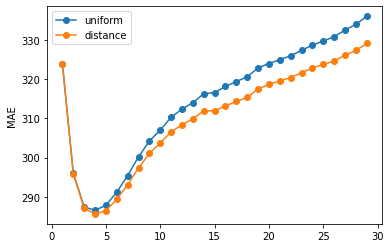

In [ ]:
from sklearn import neighbors
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
import numpy as np

from sklearn.model_selection import TimeSeriesSplit
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html
cv = TimeSeriesSplit() #


for i, weights in enumerate(['uniform', 'distance']):
   total_scores = []
   for n_neighbors in range(1,30):
       fold_accuracy = []
       knn = neighbors.KNeighborsRegressor(n_neighbors, weights=weights)
       # verificar cada uno de los modelos con validación cruzada.
       for train_fold, test_fold in cv.split(train):
          # División train test aleatoria
          f_train = train.loc[train_fold]
          f_test = train.loc[test_fold]
          # entrenamiento y ejecución del modelo
          knn.fit( X = f_train.drop(['close'], axis=1), 
                               y = f_train['close'])
          y_pred = knn.predict(X = f_test.drop(['close'], axis = 1))
          # evaluación del modelo
          mae = mean_absolute_error(f_test['close'], y_pred)
          fold_accuracy.append(mae)
       total_scores.append(sum(fold_accuracy)/len(fold_accuracy))
   
   plt.plot(range(1,len(total_scores)+1), total_scores, 
             marker='o', label=weights)
   print ('Min Value ' +  weights + " : " +  str(min(total_scores)) +" (" + str(np.argmin(total_scores) + 1) + ")")
   plt.ylabel('MAE')      
    

plt.legend()
plt.show() 

In [ ]:
# constructor
n_neighbors = 4
weights = 'uniform'
knn = neighbors.KNeighborsRegressor(n_neighbors = n_neighbors, weights=weights) 
# Prediccion
knn.fit( X = train.drop(['close'], axis=1), y = train['close'])
y_pred_knn = knn.predict(X = test.drop(['close'], axis = 1))
mae = mean_absolute_error(test['close'], y_pred_knn)
print ('MAE', mae)

MAE 106.07659722222222


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3249: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


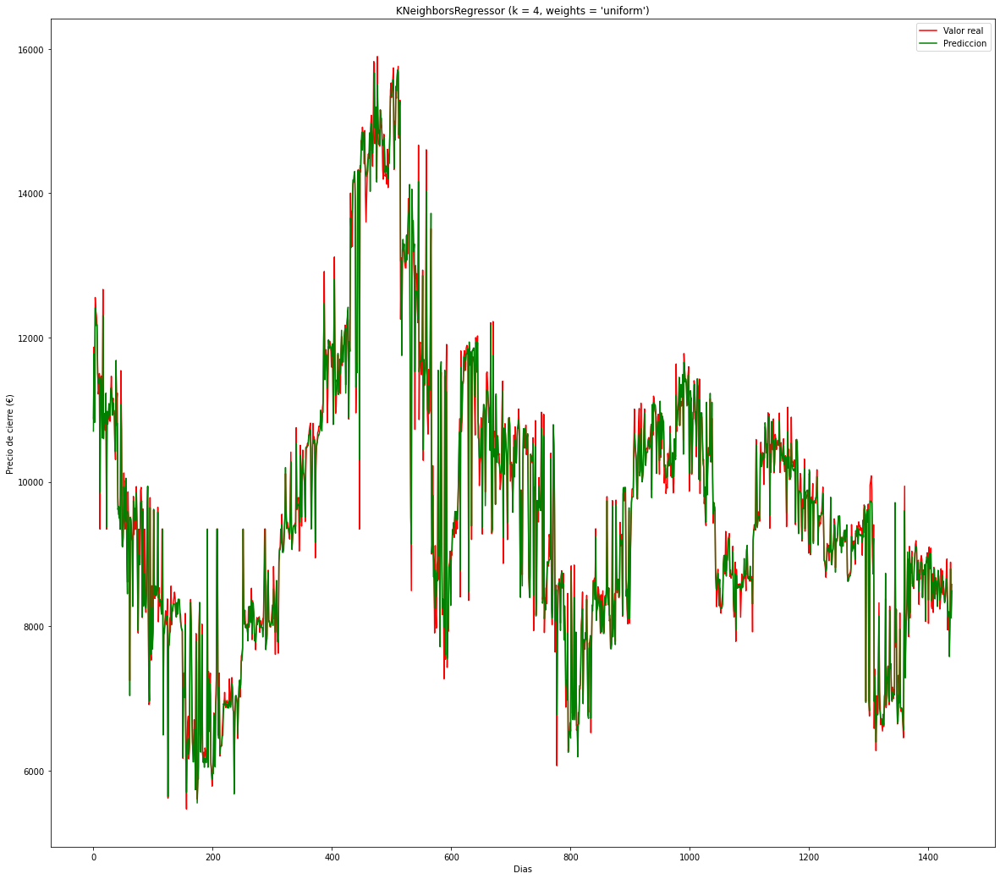

In [ ]:
from sklearn.metrics import mean_absolute_error
                    
# x axis for plotting
import numpy as np
xx = np.stack(i for i in range(test['close'].shape[0]))
plt.figure(figsize=(20,18))
plt.plot(xx, test['close'], c='r', label='Valor real')
#plt.plot(xx, y, c='k', label='data')
plt.plot(xx, y_pred_knn, c='g', label='Prediccion')
plt.axis('tight')
plt.legend()
plt.title("KNeighborsRegressor (k = %i, weights = '%s')" % (n_neighbors,
                                                          weights))
plt.xlabel('Dias')
plt.ylabel('Precio de cierre (€)')

plt.show()

In [ ]:
# Evaluacion de resultados
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(test['close'], y_pred_knn))
print('MSE:', metrics.mean_squared_error(test['close'], y_pred_knn))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['close'], y_pred_knn)))
print('R2:', metrics.r2_score(test['close'], y_pred_knn))

MAE: 106.07659722222222
MSE: 25038.090080729162
RMSE: 158.2342885746612
R2: 0.993445179558686


#ARBOLES DE DECISION

In [ ]:
# Se construye el regresor
from sklearn.tree import DecisionTreeRegressor
regressor = DecisionTreeRegressor(criterion='mae', max_depth=10, random_state=0)

In [ ]:
regressor.fit(train.drop(('close'), axis=1), train['close'])

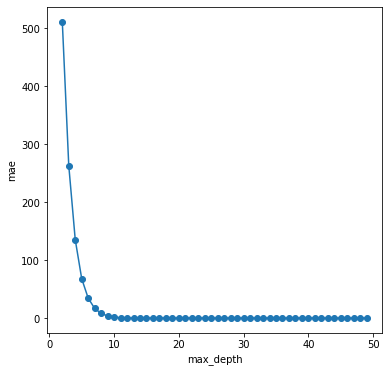

In [ ]:
# Se evalua la profundidad maxima
mae = []
from sklearn.metrics import mean_absolute_error
for i in range(2, 50):
    regressor = DecisionTreeRegressor(max_depth=i)
    regressor.fit(train[columnas], train['close'])
    pred_values = regressor.predict(train[columnas])
    maev = mean_absolute_error(train['close'],pred_values)
    mae.append(maev)
    
# Se pinta 
plt.figure(figsize=(6, 6))
plt.plot(range(2,50), mae, marker='o')
plt.xlabel('max_depth')
plt.ylabel('mae')
plt.show()

Min Value 84.18093689570404 (10)


Text(0, 0.5, 'MAE')

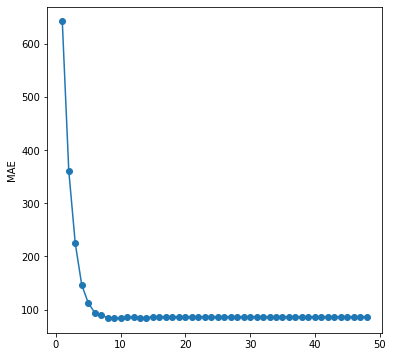

In [ ]:
# Se realiza analis de validacion cruzada
from sklearn.metrics import mean_absolute_error

# Para resetear indices
train.reset_index(drop = True, inplace = True)
from sklearn.model_selection import TimeSeriesSplit
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html
cv = TimeSeriesSplit() #


#from sklearn.model_selection import KFold
#cv = KFold(n_splits = 10, shuffle = True, random_state=0) 

total_scores = []
for i in range(2, 50):
   regressor = DecisionTreeRegressor(max_depth=i, random_state=0)
   fold_accuracy = []
   for train_fold, test_fold in cv.split(train):
      # División train-test aleatoria
      f_train = train.loc[train_fold]
      f_test = train.loc[test_fold]
      # Se entrena y ejecuta el modelo
      regressor.fit( X = f_train.drop(['close'], axis=1), 
                           y = f_train['close'])
      y_pred = regressor.predict(X = f_test.drop(['close'], axis = 1))
      # Se evalua el modelo a partir del MAE
      mae = mean_absolute_error(f_test['close'], y_pred)
      fold_accuracy.append(mae)
   total_scores.append(sum(fold_accuracy)/len(fold_accuracy))

# Se muestran los resultados obtenidos
max_depth = np.argmin(total_scores) + 2
print ('Min Value ' + str(min(total_scores)) +" (" + str(max_depth) + ")")

plt.figure(figsize=(6, 6))
plt.plot(range(1,len(total_scores)+1), total_scores, 
         marker='o')
plt.ylabel('MAE')   

In [ ]:
# Se contruye el modelo con la max profunfidad encontrada
regressor = DecisionTreeRegressor(max_depth = max_depth)
# Se ajusta y predice
regressor.fit( X = train.drop(['close'], axis=1), y = train['close'])
y_pred_decissionTree = regressor.predict(X = test.drop('close',1))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3249: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


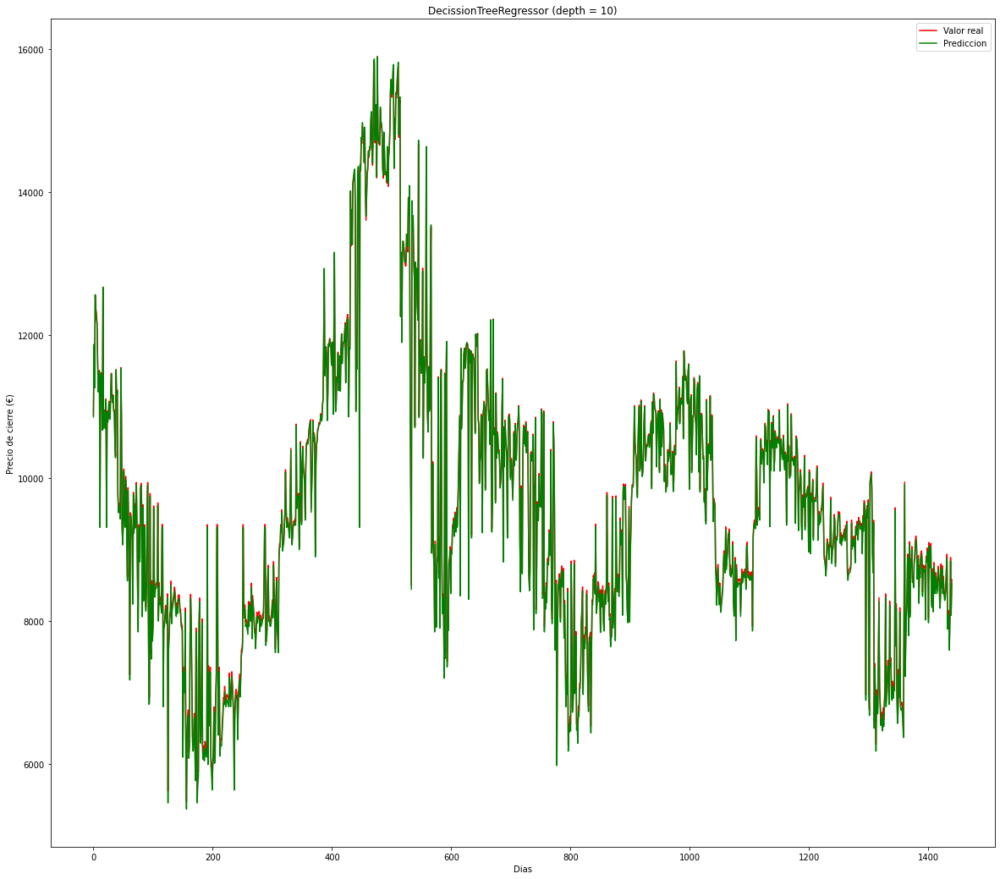

In [ ]:
from sklearn.metrics import mean_absolute_error
                 
# x axis for plotting
import numpy as np
xx = np.stack(i for i in range(test['close'].shape[0]))
plt.figure(figsize=(20,18))
plt.plot(xx, test['close'], c='r', label='Valor real')
#plt.plot(xx, y, c='k', label='data')
plt.plot(xx, y_pred_decissionTree, c='g', label='Prediccion')
plt.axis('tight')
plt.legend()
plt.title("DecissionTreeRegressor (depth = %i)" % max_depth)
plt.xlabel('Dias')
plt.ylabel('Precio de cierre (€)')

plt.show()

In [ ]:
print ('Importancia de cada variable')
pd.DataFrame({'Atributos': columnas,
             'Decision Tree': regressor.feature_importances_})

Importancia de cada variable


,Atributos,Decision Tree
0,open,2.600343e-07
1,high,3.449558e-07
2,low,7.233619e-07
3,adj close,9.996747e-01
4,tp,4.907007e-08
5,close_50_sma,6.650092e-08
6,close_10_sma,2.719023e-07
7,close_10_ema,3.209736e-04
8,ACS,2.378881e-07
9,ACX,1.041425e-07


In [ ]:
# Evaluacion de resultados
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(test['close'], y_pred_decissionTree))
print('MSE:', metrics.mean_squared_error(test['close'], y_pred_decissionTree))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['close'], y_pred_decissionTree)))
print('R2:', metrics.r2_score(test['close'], y_pred_decissionTree))

MAE: 44.6381834392859
MSE: 2500.7432712194172
RMSE: 50.00743215982418
R2: 0.9993453205472216


#RANDOM FOREST

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:407: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:407: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:407: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:407: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:4

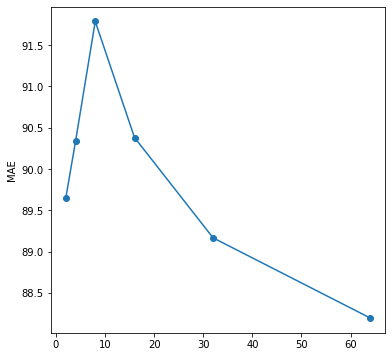

Min Value (estimators = 64, MAE =  88.19)


In [ ]:
from sklearn.model_selection import TimeSeriesSplit

cv = TimeSeriesSplit()

from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
import numpy as np

# Estimadores con los que se va a probar
l_estimators = [2, 4, 8, 16, 32, 64]

total_scores = []
for estimators in l_estimators:
   fold_accuracy = []
   regressor =  RandomForestRegressor(n_estimators= estimators, 
                  criterion='mae', random_state=0)
   for train_fold, test_fold in cv.split(train):
      # División train - test aleatoria
      f_train = train.loc[train_fold]
      f_test = train.loc[test_fold]
      # Se entrena y ejecuta el modelo
      regressor.fit( X = f_train.drop(['close'], axis=1), 
                           y = f_train['close'])
      y_pred = regressor.predict(X = f_test.drop(['close'], axis = 1))
      # Se evalua
      mae = mean_absolute_error(f_test['close'], y_pred)
      fold_accuracy.append(mae)
   total_scores.append(sum(fold_accuracy)/len(fold_accuracy))

# Se pinta el resultado
plt.figure(figsize=(6, 6))
plt.plot(l_estimators, total_scores, marker='o')
plt.ylabel('MAE')      
plt.show() 

best_est = l_estimators[np.argmin(total_scores)]
best_mae = min(total_scores)
print ("Min Value (estimators = %i, MAE = %6.2f)"  % (best_est, best_mae))

In [ ]:
# Se contruye el modelo con el mejor estimador
regressor =  RandomForestRegressor(n_estimators= best_est, criterion='mae', 
                                   random_state=0)

regressor.fit( X = train.drop(['close'], axis=1), y = train['close'])
y_pred_ensemble = regressor.predict(X = test.drop('close',1))

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:407: FutureWarning: Criterion 'mae' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='absolute_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


In [ ]:
# Evaluacion
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(test['close'],y_pred_ensemble))
print('MSE:', metrics.mean_squared_error(test['close'], y_pred_ensemble))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['close'], y_pred_ensemble)))
print('R2:', metrics.r2_score(test['close'], y_pred_ensemble))

MAE: 43.61698025173609
MSE: 2369.5956113365983
RMSE: 48.67849228701109
R2: 0.9993796542108141


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3249: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


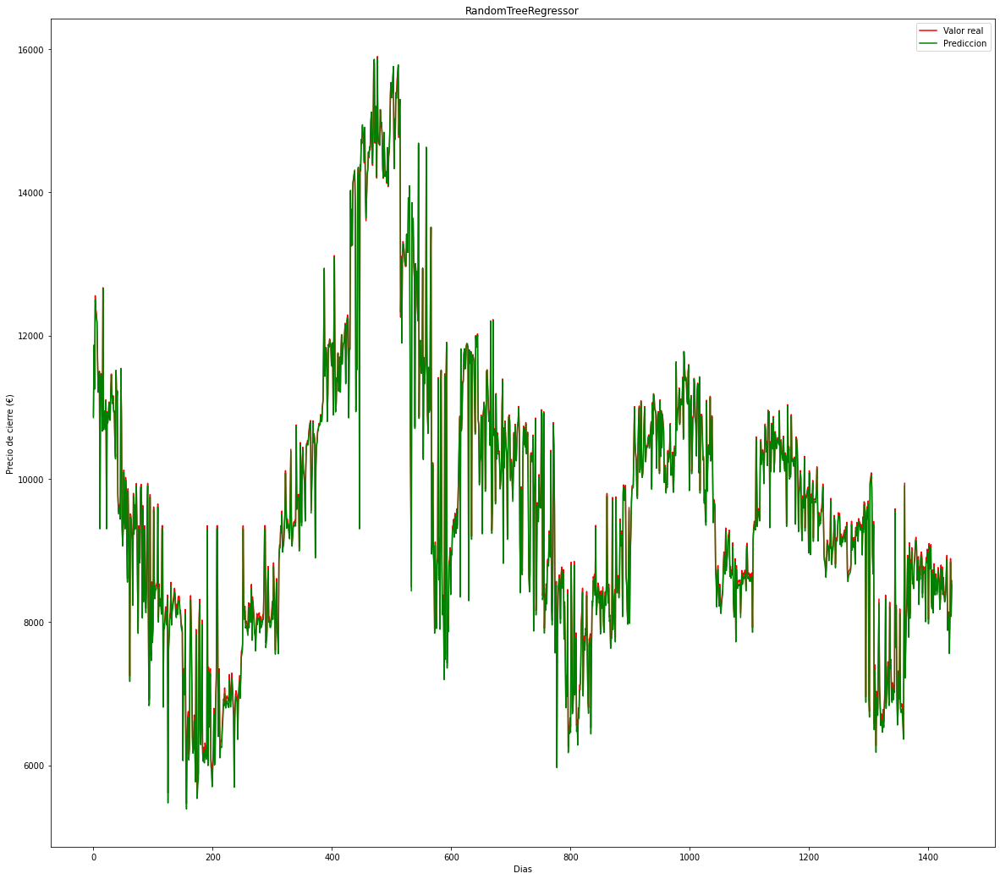

In [ ]:
from sklearn.metrics import mean_absolute_error

                    
# x axis for plotting
import numpy as np
xx = np.stack(i for i in range(test['close'].shape[0]))
plt.figure(figsize=(20,18))
plt.plot(xx, test['close'], c='r', label='Valor real')
plt.plot(xx, y_pred_ensemble, c='g', label='Prediccion')
plt.axis('tight')
plt.xlabel('Dias')
plt.ylabel('Precio de cierre (€)')
plt.legend()
plt.title("RandomTreeRegressor")

plt.show()

Optimizacion

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import randint as sp_randint

from sklearn.ensemble import RandomForestRegressor


from sklearn.model_selection import RandomizedSearchCV
from sklearn.model_selection import GridSearchCV

In [ ]:
# Se construye el regresor
regressor = RandomForestRegressor() 

In [ ]:
param_dist = {"n_estimators": [4, 8, 16, 32, 64, 128], # Numero de árbol del random forest
              "max_features": ['auto', 'sqrt'], # Numero de características a tener en cuenta
              "max_depth": [16, 12,8,4, 2,None], # Nivel máximo de niveles del árbol
              "min_samples_split": sp_randint(2, 50), #  Número mínimo de muestras necesitadas para dividir un nodo
              "min_samples_leaf": sp_randint(1, 50), # Número mínimo de muestras requeridas en cada nodo hoja
              "bootstrap": [True, False], # Método de selección de muestras para entrenar cada árbol
              "criterion": ["mse", "mae"]} # Criterio de evaluacion del modelo

In [ ]:
rnd_regres = RandomizedSearchCV(estimator = regressor, param_distributions = param_dist, 
                               n_iter = 100, cv = 5, random_state=0, n_jobs = -1)

rnd_regres.fit(X = train.drop(['close'], axis=1), 
                           y = train['close'])

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(), n_iter=100,
                   n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['mse', 'mae'],
                                        'max_depth': [16, 12, 8, 4, 2, None],
                                        'max_features': ['auto', 'sqrt'],
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f252b0ec590>,
                                        'min_samples_split': <scipy.stats._distn_infrastructure.rv_frozen object at 0x7f252b0ec510>,
                                        'n_estimators': [4, 8, 16, 32, 64,
                                                         128]},
                   random_state=0)

In [ ]:
rnd_regres.best_params_

{'bootstrap': False,
 'criterion': 'mse',
 'max_depth': 8,
 'max_features': 'auto',
 'min_samples_leaf': 1,
 'min_samples_split': 12,
 'n_estimators': 32}

In [ ]:
# Se construye el modelo a partir de lo obtenido
best_random = rnd_regres.best_estimator_

best_random.fit( X = train.drop(['close'], axis=1), y = train['close'])
y_pred_random = best_random.predict(X = test.drop('close',1))

/usr/local/lib/python3.7/dist-packages/sklearn/ensemble/_forest.py:400: FutureWarning: Criterion 'mse' was deprecated in v1.0 and will be removed in version 1.2. Use `criterion='squared_error'` which is equivalent.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """


In [ ]:
# Evaluacion
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(test['close'],y_pred_random))
print('MSE:', metrics.mean_squared_error(test['close'], y_pred_random))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['close'], y_pred_random)))
print('R2:', metrics.r2_score(test['close'], y_pred_random))

MAE: 44.19636182368151
MSE: 2499.413419928959
RMSE: 49.99413385517304
R2: 0.9993456686942406


/usr/local/lib/python3.7/dist-packages/IPython/core/interactiveshell.py:3249: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


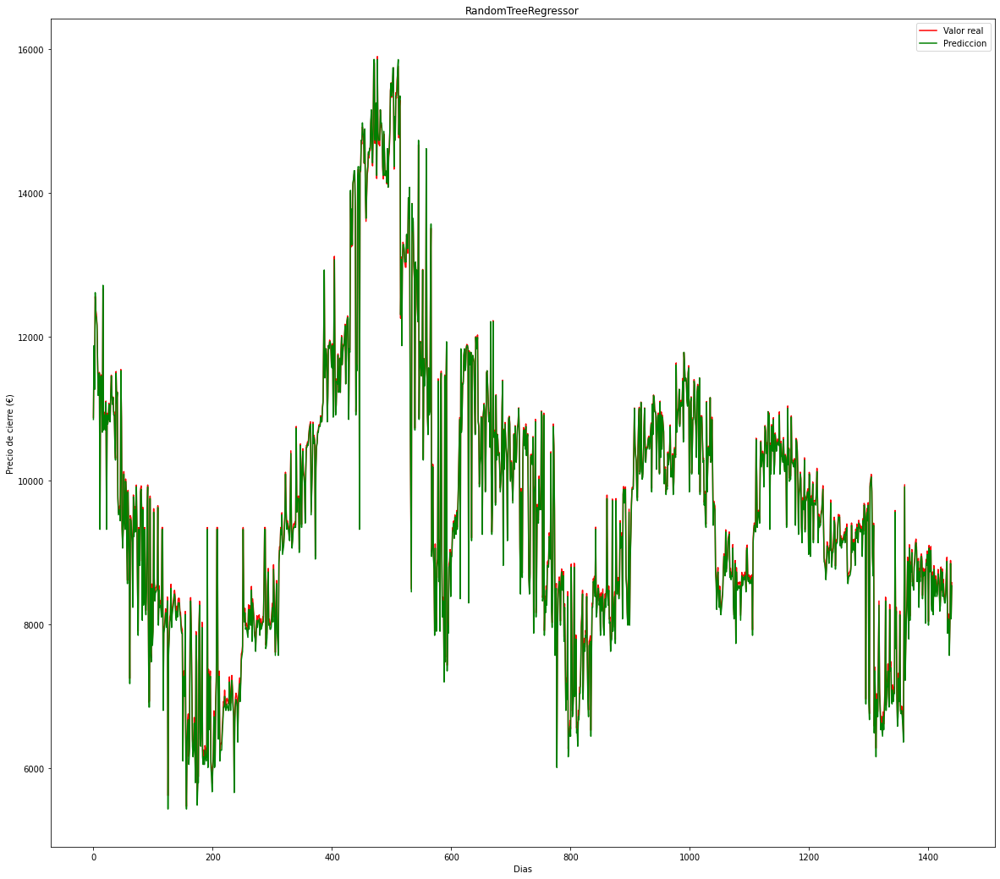

In [ ]:
from sklearn.metrics import mean_absolute_error

                    
# x axis for plotting
import numpy as np
xx = np.stack(i for i in range(test['close'].shape[0]))
plt.figure(figsize=(20,18))
plt.plot(xx, test['close'], c='r', label='Valor real')
plt.plot(xx, y_pred_random, c='g', label='Prediccion')
plt.axis('tight')
plt.xlabel('Dias')
plt.ylabel('Precio de cierre (€)')
plt.legend()
plt.title("RandomTreeRegressor")

plt.show()

#SVM

In [4]:
train = upload_files()
train = train.drop('indice',1)

test = upload_files()
test = test.drop('indice',1)

Saving TRAINNORMALIZADO75.csv to TRAINNORMALIZADO75.csv
User uploaded file "TRAINNORMALIZADO75.csv" with length 2117415 bytes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


Saving TESTNORMALIZADO75.csv to TESTNORMALIZADO75.csv
User uploaded file "TESTNORMALIZADO75.csv" with length 705641 bytes


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """


In [6]:
train = train.drop('date',1)
test = test.drop('date',1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  """Entry point for launching an IPython kernel.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only
  


Min Value 0.001 C 0.1 : 1566.6427956587797 (2)
Min Value 0.001 C 1 : 1413.0645497343785 (1)
Min Value 0.001 C 10 : 834.8201913176997 (3)
Min Value 0.001 C 100 : 560.1855975870113 (3)


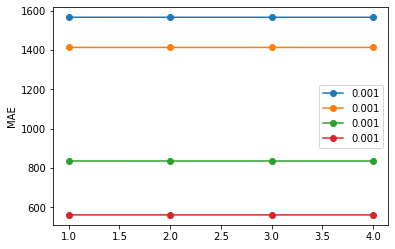

In [7]:
from sklearn import neighbors
from sklearn.model_selection import KFold
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
import numpy as np
from sklearn.svm import SVR
from sklearn import svm

from sklearn.model_selection import TimeSeriesSplit
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.TimeSeriesSplit.html
cv = TimeSeriesSplit() #

C_arr = [0.1,1,10,100]
eps_arr = [1,0.1,0.01,0.001]

for C in C_arr:
   total_scores = []
   for epsilon in eps_arr:
       fold_accuracy = []
       svr = svm.SVR(kernel='rbf', C=C, epsilon = epsilon)
       # verificar cada uno de los modelos con validación cruzada.
       for train_fold, test_fold in cv.split(train):
          # División train test aleatoria
          f_train = train.loc[train_fold]
          f_test = train.loc[test_fold]
          # entrenamiento y ejecución del modelo
          svr.fit( X = f_train.drop(['close'], axis=1), 
                               y = f_train['close'])
          y_pred = svr.predict(X = f_test.drop(['close'], axis = 1))
          # evaluación del modelo
          mae = mean_absolute_error(f_test['close'], y_pred)
          fold_accuracy.append(mae)
       total_scores.append(sum(fold_accuracy)/len(fold_accuracy))
   
   plt.plot(range(1,len(total_scores)+1), total_scores, 
             marker='o', label=epsilon)
   print ('Min Value ' +  str(epsilon) + " C " + str(C) + " : " +  str(min(total_scores)) +" (" + str(np.argmin(total_scores) + 1) + ")")
   plt.ylabel('MAE')      
    

plt.legend()
plt.show() 

In [ ]:
# Se contruye el modelo con el mejor estimador
SVMregressor =  svm.SVR(kernel='rbf', C= 100, epsilon = 0.001)

SVMregressor.fit( X = train.drop(['close'], axis=1), y = train['close'])
y_pred_svm = SVMregressor.predict(X = test.drop('close',1))

In [ ]:
# Evaluacion
from sklearn import metrics

print('MAE:', metrics.mean_absolute_error(test['close'],y_pred_svm))
print('MSE:', metrics.mean_squared_error(test['close'], y_pred_svm))
print('RMSE:', np.sqrt(metrics.mean_squared_error(test['close'], y_pred_svm)))
print('R2:', metrics.r2_score(test['close'], y_pred_svm))

In [ ]:
from sklearn.metrics import mean_absolute_error
               
# x axis for plotting
import numpy as np
xx = np.stack(i for i in range(test['close'].shape[0]))
plt.figure(figsize=(20,18))
plt.plot(xx, test['close'], c='r', label='Valor real')
plt.plot(xx, y_pred_svm, c='g', label='Prediccion')
plt.axis('tight')
plt.xlabel('Dias')
plt.ylabel('Precio de cierre (€)')
plt.legend()
plt.title("SVM Regressor")

plt.show()

In [ ]:
param_dist_svm = {#"kernel": ['linear', 'poly', 'rbf', 'sigmoid', 'precomputed'], # Numero de árbol del random forest
              "C": [0.1,1,10,100], 
              "epsilon": [1,0.1,0.01,0.001], 
              "verbose": [True, False], #  Número mínimo de muestras necesitadas para dividir un nodo
              "max_iter": [True, False]} # Criterio de evaluacion del modelo

In [ ]:
from sklearn.svm import SVR
from sklearn import svm
SVMregressor =  svm.SVR()

In [ ]:
rnd_svm = RandomizedSearchCV(estimator = SVMregressor, param_distributions = param_dist_svm,  
                               n_iter = 100, random_state=0)

rnd_svm.fit(X = train.drop(['close'], axis=1), 
                           y = train['close'])

SyntaxError: ignored